In [1]:
import os
os.environ['OPENBLAS_NUM_THREADS'] = '1'

%matplotlib inline

import csv
import re
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from csv_reader import read_csv
from aux import set_smallest_n_zero
from copy import deepcopy as copy

plt.rcParams['font.size'] = 15
plt.rcParams['axes.linewidth'] = 3.0

warnings.filterwarnings('ignore')

rule_names = [ # Define labels for all rules to be run during simulations
    r'',
    r'$y$',
    r'$x$',
    # r'$y^2$',
    # r'$x^2$',
    r'$x \, y$',
    # r'$x \, y^2$',
    # r'$x^2 \, y$',
    # r'$x^2 \, y^2$',
    r'$y_{int}$',
    r'$x \, y_{int}$',
    r'$x_{int}$',
    r'$x_{int} \, y$',
    # r'$x_{int} \, y^2$',
    r'$y_{int} \, y$',
    r'$x_{int} \, x$',

    r'$w$',
    r'$w \, y$',
    r'$w \, x$',
    # r'$w \, y^2$',
    # r'$w \, x^2$',0
    r'$w \, x \, y$',
    # r'$w \, x \, y^2$',
    # r'$w \, x^2 \, y$',
    # r'$w \, x^2 \, y^2$',
    r'$w y_{int}$',
    r'$w x \, y_{int}$',
    r'$w x_{int}$',
    r'$w x_{int} \, y$',
    # r'$w x_{int} \, y^2$',
    r'$w y_{int} \, y$',
    r'$w x_{int} \, x$',
    
    # r'$w^2$',
    # r'$w^2 \, y$',
    # r'$w^2 \, x$',
    # r'$w^2 \, y^2$',
    # r'$w^2 \, x^2$',
    # r'$w^2 \, x \, y$',
    # r'$w^2 \, x \, y^2$',
    # r'$w^2 \, x^2 \, y$',
    # r'$w^2 \, x^2 \, y^2$',
    # r'$w^2 y_{int}$',
    # r'$w^2 x \, y_{int}$',
    # r'$w^2 x_{int}$',
    # r'$w^2 x_{int} \, y$',
]

general_rule_names = copy(rule_names)

rule_names = [
    [r'$E \rightarrow E$ ' + r_name for r_name in rule_names],
    [r'$E \rightarrow I$ ' + r_name for r_name in rule_names],
    [r'$I \rightarrow E$ ' + r_name for r_name in rule_names],
]
rule_names = np.array(rule_names).flatten()

In [2]:
def format_single_axs(axs):
    axs.spines['right'].set_visible(False)
    axs.spines['top'].set_visible(False)

def format_axs(axs):
    if type(axs) is list or type(axs) is np.ndarray:
        for i in range(len(axs)):
            format_single_axs(axs[i])
    else:
        format_single_axs(axs)

def calc_entropy(l):
    abs_l = np.abs(l)
    per_l = abs_l / np.sum(abs_l)
    return -np.dot(np.log(per_l), per_l)
        
def find_desc_indices(x, losses):
    min_loss = losses[0]
    x_mins = [0]
    
    for i, x_i in enumerate(x):
        if losses[i] < min_loss:
            x_mins.append(x_i)
            min_loss = losses[i]
    return np.array(x_mins)
      
def plot_all_2(file_name, n_plasticity_coefs, n_time_constants, batch_size, start=0, yscale=None, n_categories=1, loss_yscale=None):
    train_data_path = f'./sims_out/{file_name}/train_data.csv'
    test_data_path = f'./sims_out/{file_name}/test_data.csv'
    
    df_train = read_csv(train_data_path, read_header=False)
    df_test = read_csv(test_data_path, read_header=False)
    
    # plot synaptic effects per rule
    scale = 2
    fig, axs = plt.subplots(1, 2, figsize=(6 * scale, 2.5 * scale))
    format_axs(axs)
    
    axs[0].set_xlabel('Epochs')
    axs[0].set_ylabel('Synaptic effect')
    if yscale is not None:
        axs[0].set_ylim(0, yscale)
    
    syn_effect_start = 2 + batch_size + n_plasticity_coefs + n_time_constants
    syn_effect_end = 2 + batch_size + n_plasticity_coefs + n_time_constants + n_plasticity_coefs
    x = np.arange(df_train.shape[0])[start:]
    losses = df_train[df_train.columns[1]][start:]
    x_mins = []

    for i in range(0, len(x), 15):
        x_mins.append(np.argmin(losses[i:i+15]) + i)
        
    x_mins = np.array(x_mins)
    x_best_min = np.argmin(losses)
    
#     x_test = df_test[df_test.columns[0]]
#     losses_test = df_test[df_test.columns[1]]
    
    final_syn_effects = []
    final_coefs = []
    
    for i in range(syn_effect_start, syn_effect_end):
#         axs[0].plot(df_train[df_train.columns[0]][start:][x_mins], df_train[df_train.columns[i]][start:][x_mins])
        
        final_syn_effects.append(df_train[df_train.columns[i]][start:][x_best_min])
        
    final_syn_effects = np.array(final_syn_effects)
        
    axs[1].plot(x_mins[1:-1], losses[x_mins[1:-1]], color='black')
#     axs[1].plot(x_test, losses_test, color='blue')
#     axs[1].set_ylim(0, 200)
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epochs')
        
    plasticity_coefs_start = 2 + batch_size
    plasticity_coefs_end = 2 + batch_size + n_plasticity_coefs + n_time_constants
    
    for i in range(plasticity_coefs_start, plasticity_coefs_end):
        axs[0].plot(df_train[df_train.columns[0]][start:][x_mins], df_train[df_train.columns[i]][start:][x_mins])
        final_coefs.append(df_train[df_train.columns[i]][start:][x_best_min])
        
    fig.tight_layout()
    
    final_coefs = np.array(final_coefs)
    print(final_coefs)
    
    # plot the synaptic effects of each plasticity rule (unsorted by size)
    scale = 2
    fig, axs = plt.subplots(n_categories, 1, figsize=(6 * scale, 6 * scale))
    
    partial_rules_len = int(len(final_syn_effects) / n_categories)

    for l in range(n_categories):
        format_axs(axs[l])
        x = np.arange(partial_rules_len)
        y = final_syn_effects[l * partial_rules_len: (l+1) * partial_rules_len]
        colors = np.where(final_coefs[l * partial_rules_len: (l+1) * partial_rules_len] > 0, 'green', 'red')
#         y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
        axs[l].bar(x, y, color=colors, alpha=0.3)
        axs[l].set_xticks(np.arange(partial_rules_len))
        axs[l].set_xticklabels(rule_names[l * partial_rules_len: (l+1) * partial_rules_len], rotation=60, ha='right')
        axs[l].set_ylabel('Absolute synaptic change')
        axs[l].set_xlim(-1, partial_rules_len)    
    
    fig.tight_layout()
    
    # plot entropy of synaptic change per rule against epochs
    scale = 2
    fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
    format_axs(axs)
    
    axs.set_xlabel('Epochs')
    axs.set_ylabel('Entropy')
    
    entropy = []
    for i in x_mins[1:]:
        syn_effects_i = np.array(df_train.iloc[i][syn_effect_start:syn_effect_end])
#         if i % 100:
#             print(syn_effects_i)
        entropy.append(calc_entropy(syn_effects_i))
        
    entropy = np.array(entropy)
    
    axs.plot(x_mins[1:], entropy, c='green')

    return np.array(final_syn_effects), np.array(final_coefs), losses[x_best_min]

[-0.0045212  -0.01522173  0.00763115  0.00365092 -0.01411154 -0.0002811
 -0.0131764   0.00993857 -0.01482524  0.01190828 -0.00247632 -0.0003547
 -0.0146163  -0.00558603  0.02561272  0.00371381 -0.00152954  0.01288505
 -0.01452339  0.01283362 -0.01280527  0.00512676 -0.00112916  0.00084397
  0.01035566  0.00975324 -0.00481034 -0.00624221 -0.02228079 -0.00246321
 -0.00986303  0.00062842  0.0003074   0.01957017 -0.00632802 -0.00830384
  0.01748169 -0.00748122  0.01674839 -0.00737054 -0.00133321  0.00663915
  0.00623221 -0.01955657  0.00022271 -0.01084581 -0.01070932  0.01063678
 -0.00053472  0.00995211 -0.00225439  0.00906512  0.00074289  0.01369379
  0.00807823 -0.01073598 -0.00389425  0.00192547 -0.02061949 -0.00415047
  0.00581147  0.00668418  0.003009    0.00376173  0.00361446  0.00359646
  0.00320336  0.00243331  0.01010345  0.01621599  0.00197769  0.00057348
  0.0088248   0.00232574  0.00603512  0.01506841  0.00468618  0.00496737
  0.0077497   0.00992268  0.0091633   0.01371301  0.0

(-1.0, 96.0)

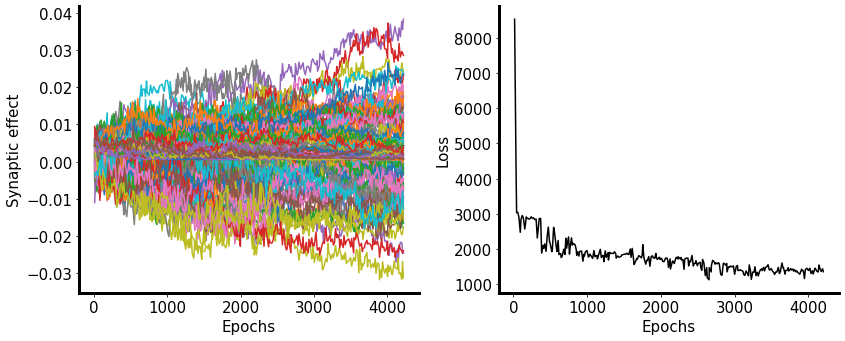

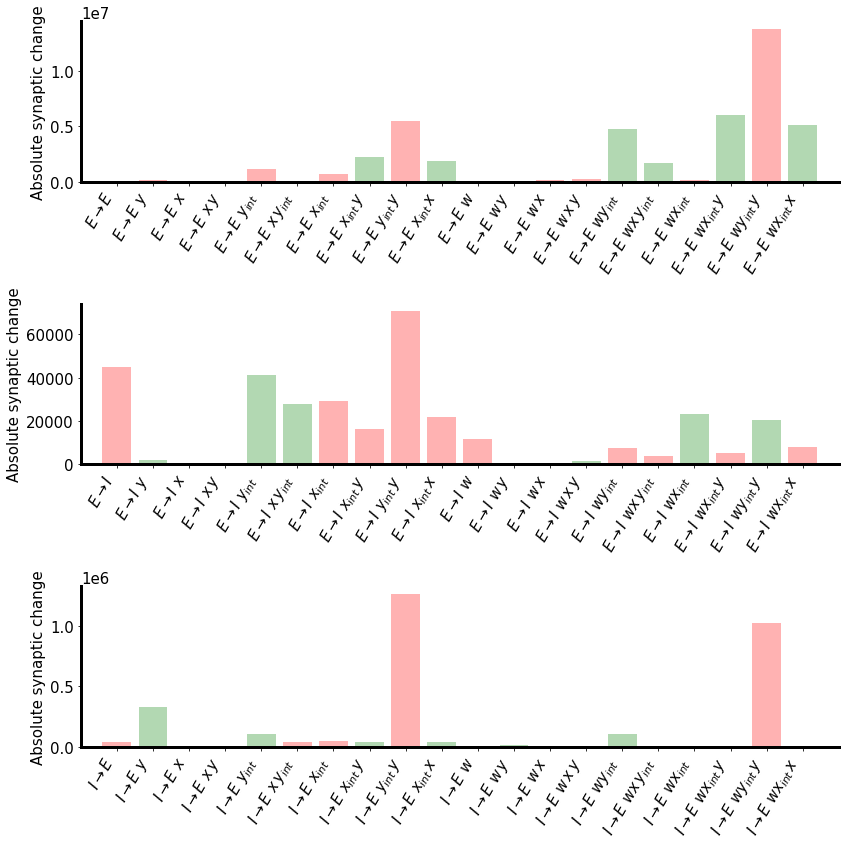

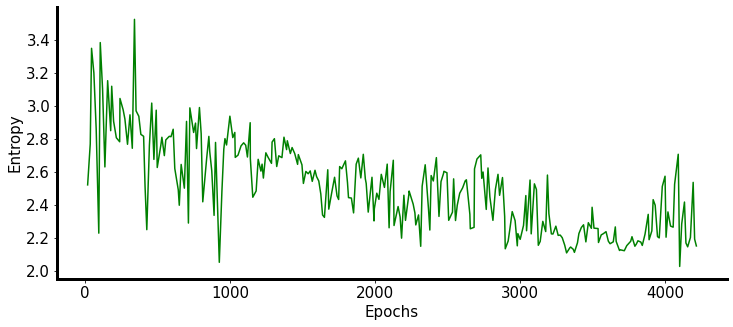

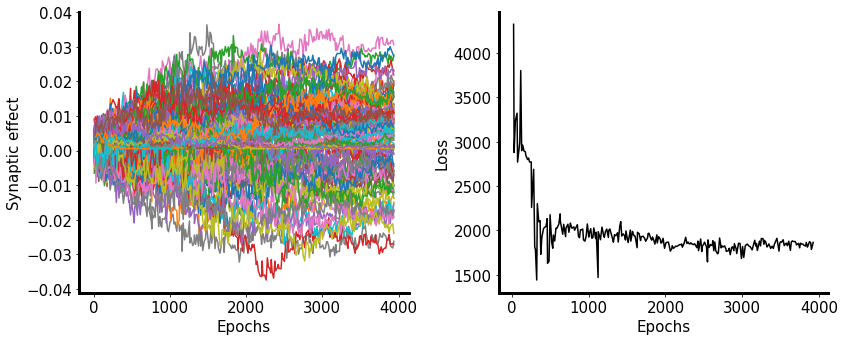

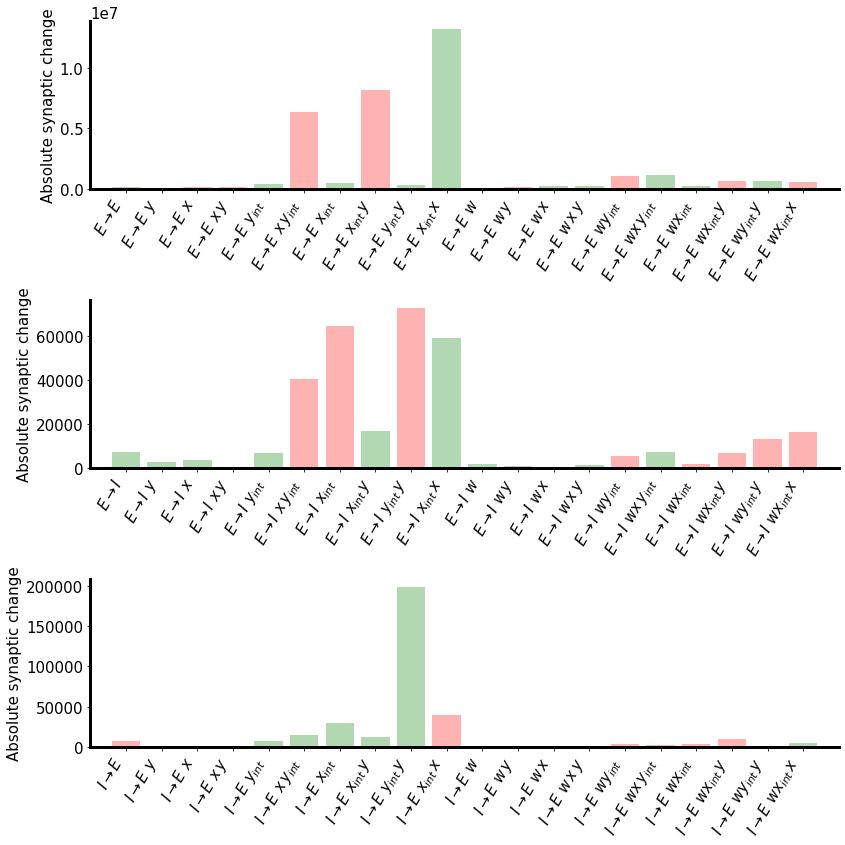

...

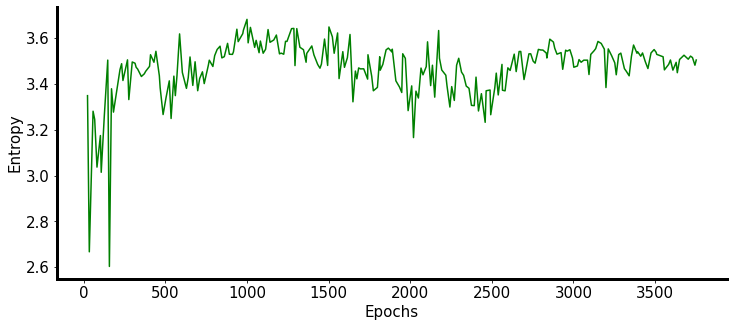

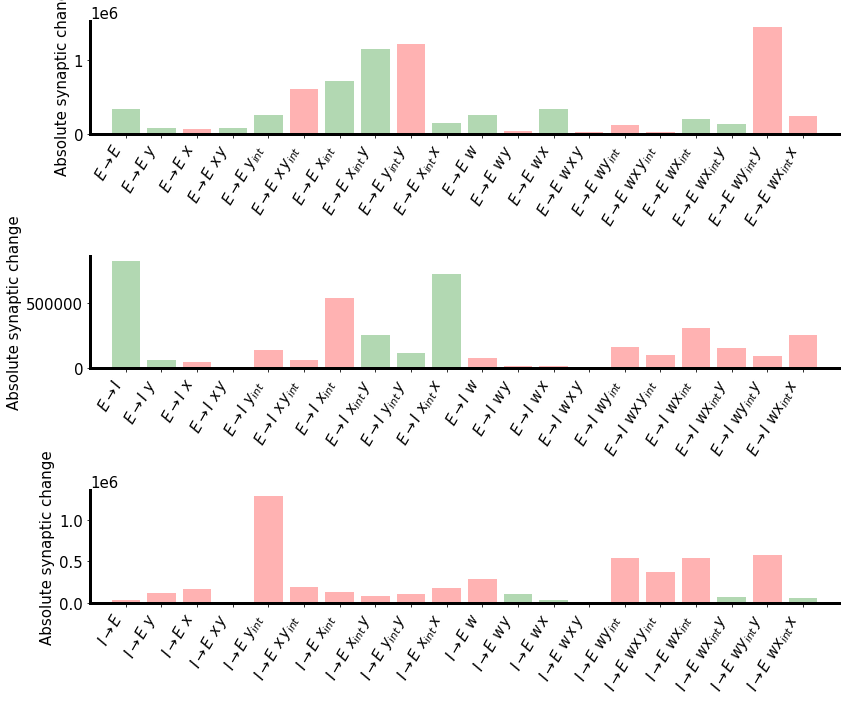

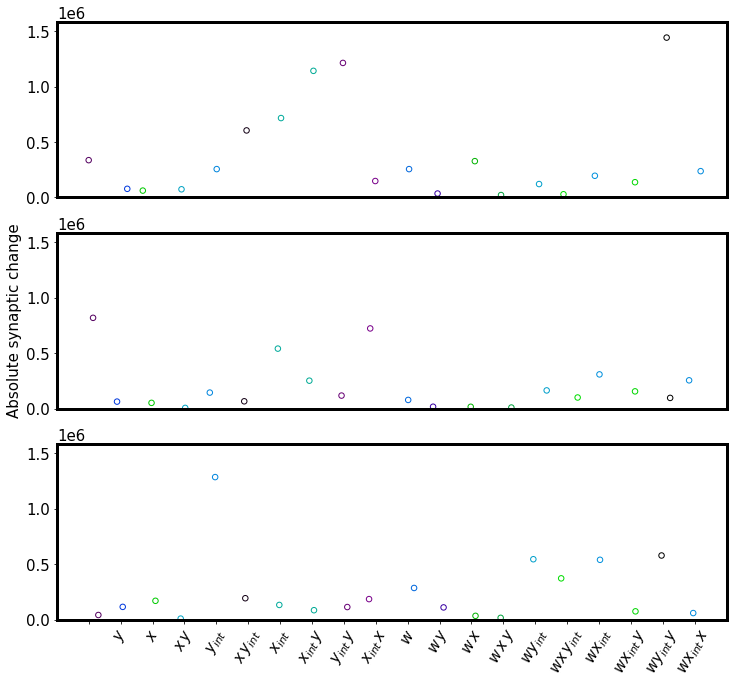

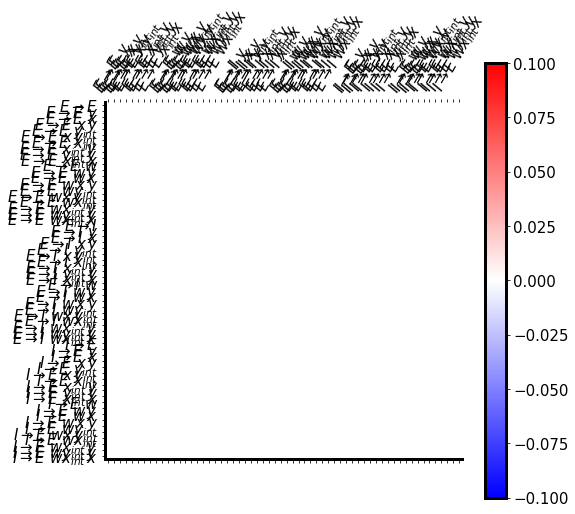

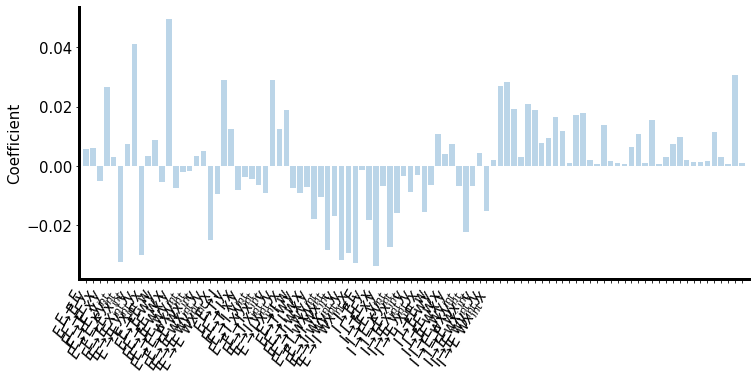

In [3]:
all_files = [
    'decoder_all_small_act_pen_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6000_2023-05-31_10:08:41.348490',
    'decoder_all_small_act_pen_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6001_2023-05-31_10:09:29.557758',
    'decoder_all_small_act_pen_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6002_2023-05-31_10:09:29.595032',
]
n_categories = 3

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 60, 36, 10, n_categories=3)
    if best_loss_for_f < 1000:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

print(final_plasticity_coef_means)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
fig, axs = plt.subplots(n_categories, 1, figsize=(6 * scale, 5 * scale))
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    format_axs(axs[l])
    x = np.arange(partial_rules_len)
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    colors = np.where(final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len] > 0, 'green', 'red')
    axs[l].bar(x, y, alpha=0.3, color=colors)
    axs[l].errorbar(x, y, yerr=y_err, ls='none', color='black')
    
    axs[l].set_xticks(np.arange(partial_rules_len))
    axs[l].set_xticklabels(rule_names[l * partial_rules_len: (l+1) * partial_rules_len], rotation=60, ha='right')
    axs[l].set_ylabel('Absolute synaptic change')
    axs[l].set_xlim(-1, partial_rules_len)
    
fig.tight_layout()

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

x = np.arange(len(final_plasticity_coef_means))
y = final_plasticity_coef_means
axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
tick_labels = list(rule_names[:len(final_syn_effect_means)]) + ([''] * 36)
axs2.set_xticklabels(tick_labels, rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

[ 0.03866106  0.00994062  0.03919121  0.01242816 -0.0154217  -0.00381139
 -0.00031714  0.01675176  0.00952264 -0.00383555  0.0106317  -0.05640665
 -0.04228874 -0.02719912  0.00475433 -0.02499965  0.01457543 -0.01038733
 -0.0234217   0.00715496  0.0022977  -0.03331291  0.00449942 -0.02435422
 -0.00207555 -0.0210066   0.014985    0.02299291 -0.00568893 -0.00181382
 -0.01797569  0.01501156  0.05512528  0.02228163 -0.02756925 -0.02064382
 -0.02601656 -0.00880084  0.0214668   0.02737062  0.00491914  0.00376585
 -0.01945652  0.0418152  -0.00099509  0.00792825 -0.01548927 -0.00600408
  0.01460461 -0.00606162 -0.0416249  -0.03470461 -0.00734519  0.0136314
  0.00342425 -0.03880357 -0.00978991  0.06289967  0.02929688  0.01196959
  0.01845073  0.01462846  0.0005658   0.01573523  0.00365803  0.01061218
  0.03383984  0.01407058  0.03788749  0.00052914  0.00050033  0.03749532
  0.03706062  0.00358242  0.00885418  0.01530189  0.00051744  0.02335793
  0.01795703  0.03305723  0.00368374  0.00458642  0.

(-1.0, 96.0)

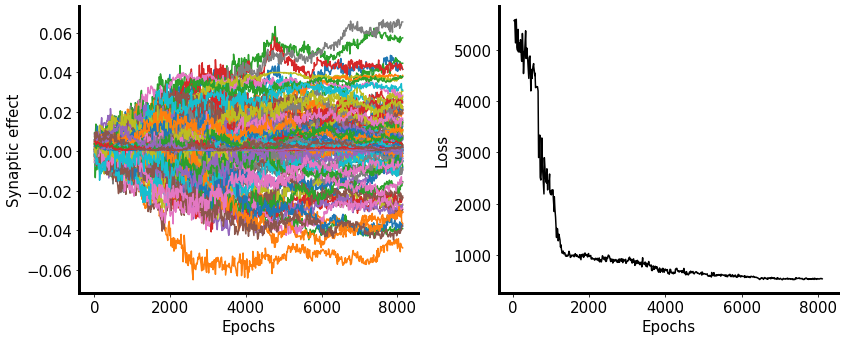

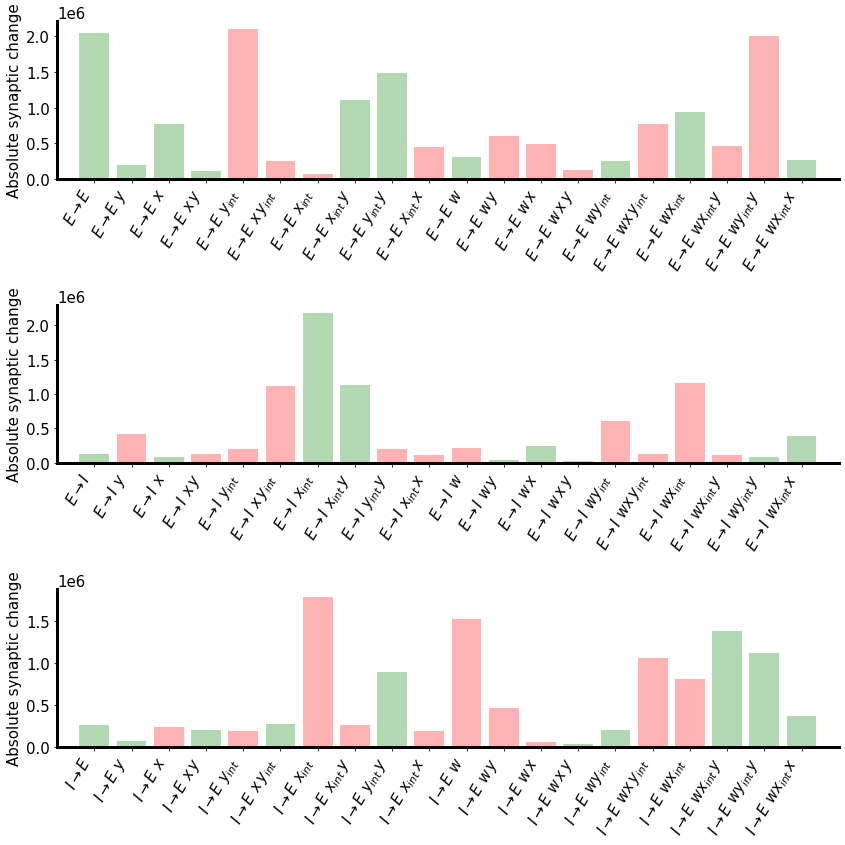

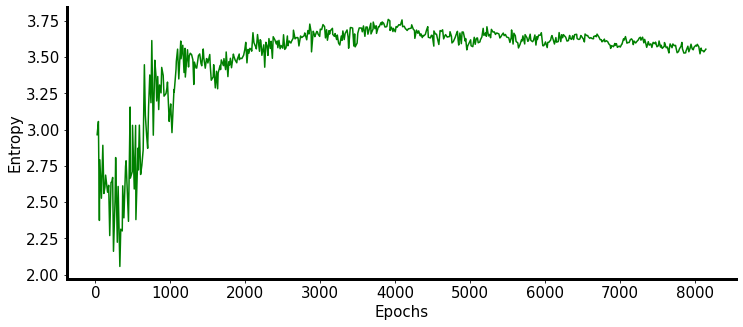

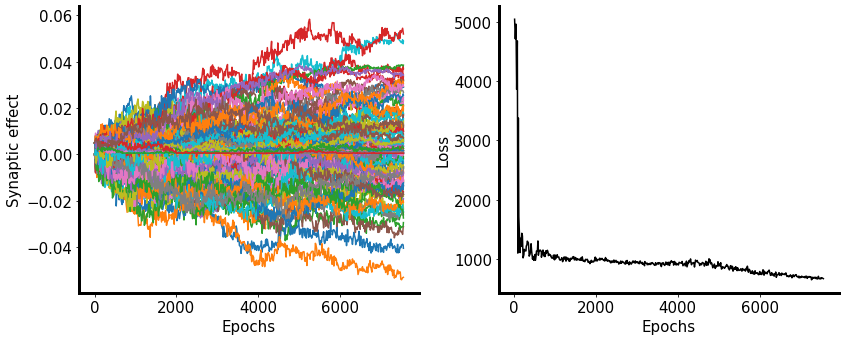

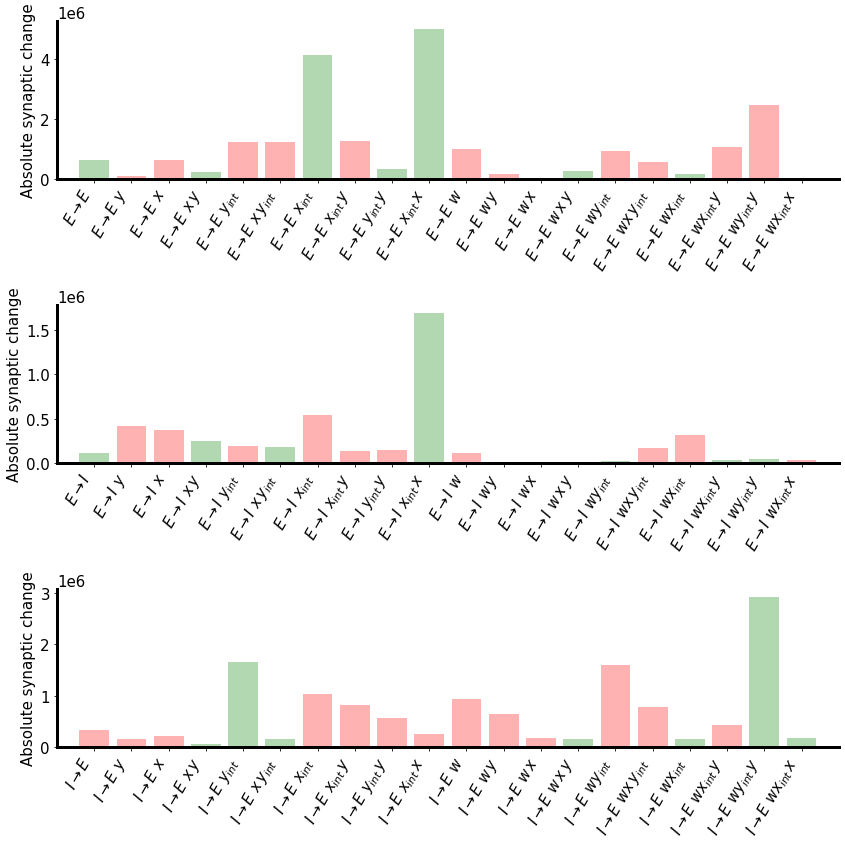

...

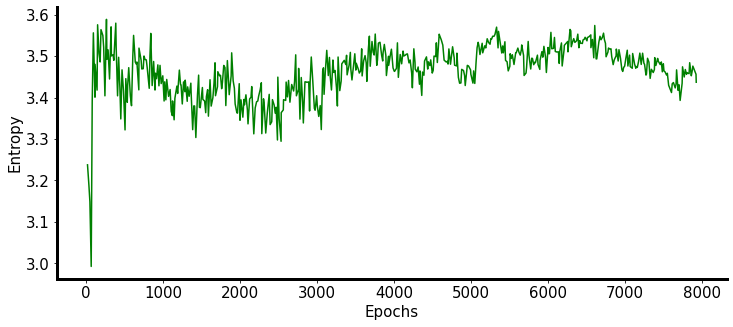

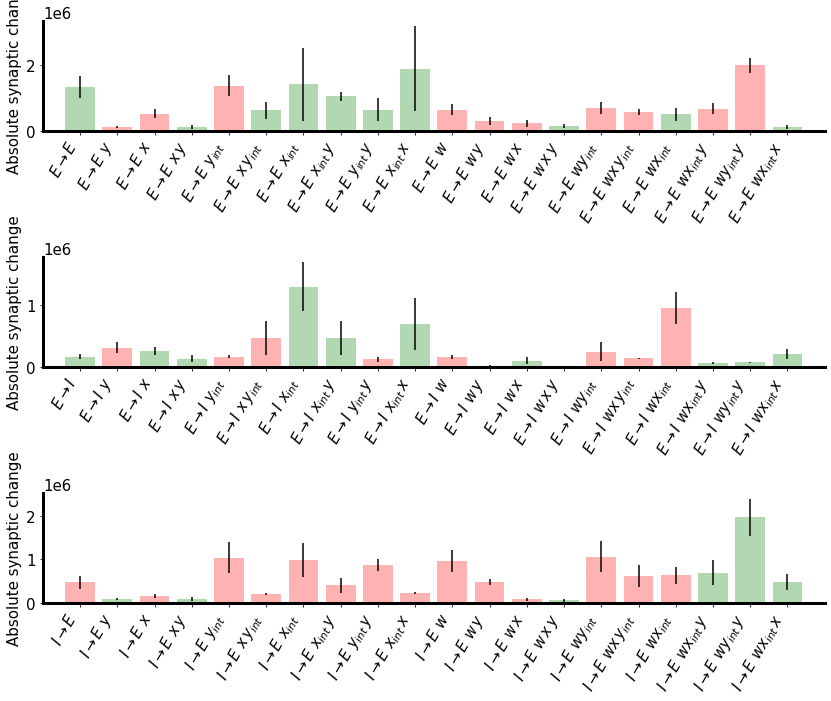

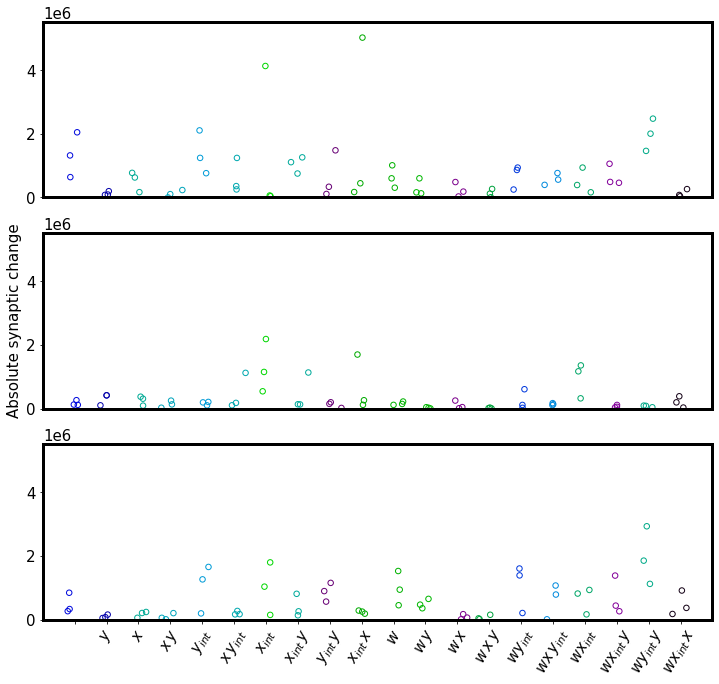

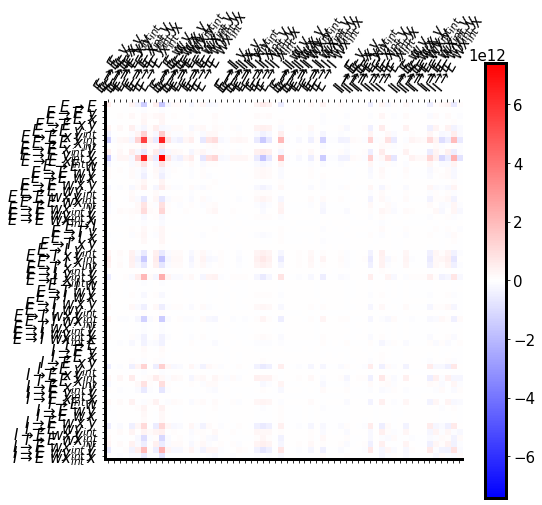

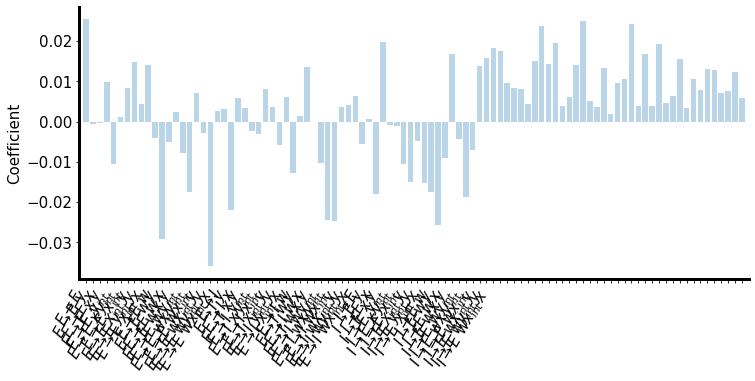

In [5]:
all_files = [
    'seq_self_org_decoder_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.001_FRACI_0.75_SEED_6000_2023-05-14_17:16:26.259916',
    'seq_self_org_decoder_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.001_FRACI_0.75_SEED_6001_2023-05-14_17:02:03.940448',
    'seq_self_org_decoder_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.001_FRACI_0.75_SEED_6002_2023-05-12_15:18:28.247886',
]
n_categories = 3

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 60, 36, 10, n_categories=3)
    if best_loss_for_f < 1000:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

print(final_plasticity_coef_means)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
fig, axs = plt.subplots(n_categories, 1, figsize=(6 * scale, 5 * scale))
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    format_axs(axs[l])
    x = np.arange(partial_rules_len)
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    colors = np.where(final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len] > 0, 'green', 'red')
    axs[l].bar(x, y, alpha=0.3, color=colors)
    axs[l].errorbar(x, y, yerr=y_err, ls='none', color='black')
    
    axs[l].set_xticks(np.arange(partial_rules_len))
    axs[l].set_xticklabels(rule_names[l * partial_rules_len: (l+1) * partial_rules_len], rotation=60, ha='right')
    axs[l].set_ylabel('Absolute synaptic change')
    axs[l].set_xlim(-1, partial_rules_len)
    
fig.tight_layout()

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

x = np.arange(len(final_plasticity_coef_means))
y = final_plasticity_coef_means
axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
tick_labels = list(rule_names[:len(final_syn_effect_means)]) + ([''] * 36)
axs2.set_xticklabels(tick_labels, rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

In [ ]:
all_files = [
    'seq_self_org_decoder_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6000_2023-05-14_09:54:46.088510',
    'seq_self_org_decoder_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6001_2023-05-14_16:36:33.445501',
    'seq_self_org_decoder_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_6002_2023-05-11_11:08:46.858867',
]
n_categories = 3

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 60, 36, 10, n_categories=3)
    if best_loss_for_f < 500:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

print(final_plasticity_coef_means)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
fig, axs = plt.subplots(n_categories, 1, figsize=(6 * scale, 5 * scale))
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    format_axs(axs[l])
    x = np.arange(partial_rules_len)
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    colors = np.where(final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len] > 0, 'green', 'red')
    axs[l].bar(x, y, alpha=0.3, color=colors)
    axs[l].errorbar(x, y, yerr=y_err, ls='none', color='black')
    
    axs[l].set_xticks(np.arange(partial_rules_len))
    axs[l].set_xticklabels(rule_names[l * partial_rules_len: (l+1) * partial_rules_len], rotation=60, ha='right')
    axs[l].set_ylabel('Absolute synaptic change')
    axs[l].set_xlim(-1, partial_rules_len)
    
fig.tight_layout()

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

x = np.arange(len(final_plasticity_coef_means))
y = final_plasticity_coef_means
axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
tick_labels = list(rule_names[:len(final_syn_effect_means)]) + ([''] * 36)
axs2.set_xticklabels(tick_labels, rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

[ 0.00555704 -0.00984875  0.02147319  0.01639922 -0.00214515  0.02376366
 -0.0003167   0.0385889  -0.01360985  0.0023069   0.00442925 -0.04749025
 -0.01455491  0.01868311 -0.02449608 -0.00424987  0.00670422  0.01694875
 -0.00230806 -0.01291596  0.0021033   0.02309157 -0.00283447 -0.01482722
 -0.00376036 -0.0223155   0.00404041  0.02112716  0.01046085  0.01418472
 -0.00760893  0.00016248 -0.01694907 -0.00685186 -0.00963474 -0.01228058
 -0.01654068  0.00977486 -0.02324204 -0.02858681  0.00010204  0.02203385
  0.00874306 -0.03234454 -0.02155154 -0.01759414 -0.01218303  0.0147379
  0.00054903 -0.01159637 -0.01820406  0.01087561  0.0292514   0.02076239
 -0.00377015 -0.01107384 -0.00181412 -0.00132599 -0.00390161 -0.02189329
  0.00139201  0.00153778  0.00166848  0.0089576   0.01626661  0.01540107
  0.00173992  0.00290946  0.01066111  0.01051254  0.00603535  0.01854424
  0.00520491  0.0283684   0.00683158  0.00086248  0.0078777   0.00053107
  0.00447654  0.01819198  0.00204638  0.00519888  0.

In [ ]:
all_files = [
    'seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_4000_2023-04-28_00:04:21.643905',
    'seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_4001_2023-04-28_00:04:21.642395',
    'seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0_FRACI_0.75_SEED_4002_2023-04-27_23:37:16.982792',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 20, 12, 10, n_categories=1)
    if best_loss_for_f < 1200:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

print(final_plasticity_coef_means)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    colors = np.where(final_plasticity_coef_means > 0, 'green', 'red')
    axs.bar(x, y, alpha=0.3, color=colors)
    axs.errorbar(x, y, yerr=y_err, ls='none', color='black')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

x = np.arange(len(final_plasticity_coef_means))
y = final_plasticity_coef_means
axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
tick_labels = list(rule_names[:len(final_syn_effect_means)]) + ([''] * 12)
axs2.set_xticklabels(tick_labels, rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

[ 0.01405891  0.00893183  0.0058447  -0.00401107 -0.01024546 -0.06046646
  0.02588434  0.03937192 -0.06240291  0.0046584   0.02233139  0.01550457
  0.01035417  0.01666378 -0.03021525 -0.01582839  0.01936836  0.05292744
 -0.04610955 -0.01989828  0.0096814   0.02763497  0.00542073  0.00056823
  0.01586344  0.01044816  0.00446417  0.00797262  0.00118035  0.00627466
  0.00289137  0.00595298]
seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0007_FRACI_0.75_SEED_4000_2023-04-28_14:10:50.919878
[ 0.01953748 -0.03729984 -0.04135545 -0.02548277 -0.00714775 -0.03039706
  0.03485715  0.03434261 -0.03447649 -0.01912324  0.00998046 -0.00125189
 -0.00928733  0.0132921  -0.0228615   0.00326772  0.01562103  0.05993522
 -0.04143482 -0.01006818  0.00644689  0.03846169  0.00313236  0.00068199
  0.00963184  0.02071704  0.00051217  0.0231293   0.01664547  0.00944922
  0.00227487  0.00570984]
seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_P

(-1.0, 32.0)

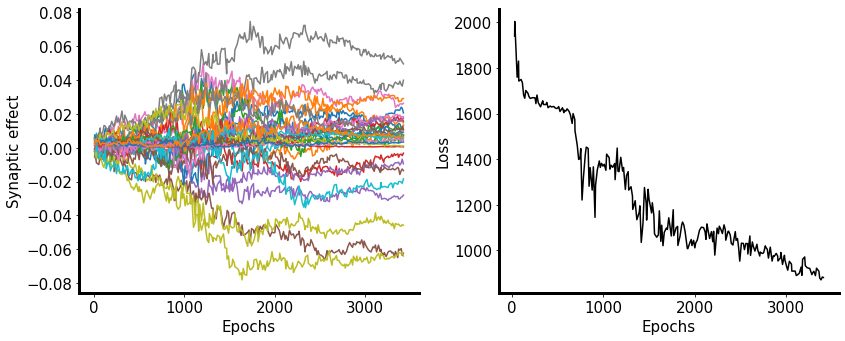

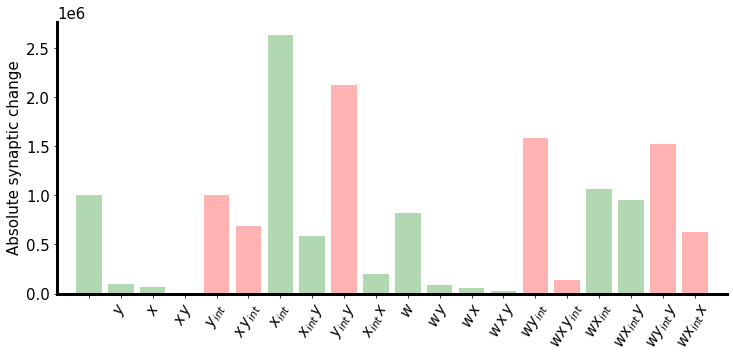

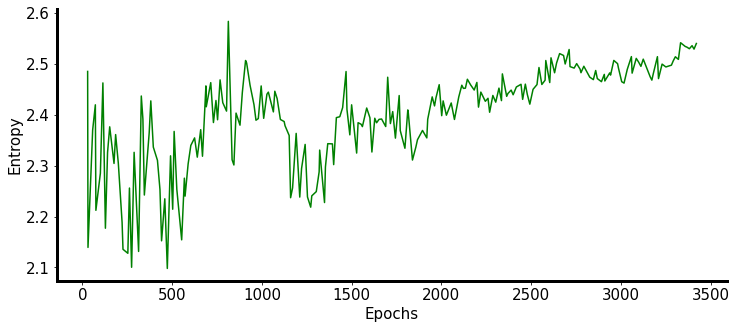

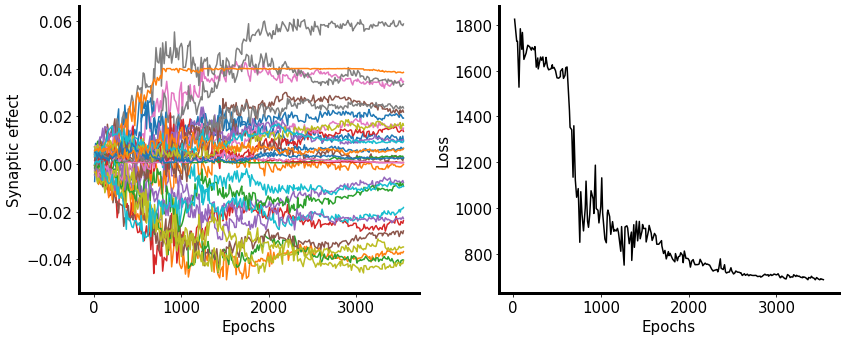

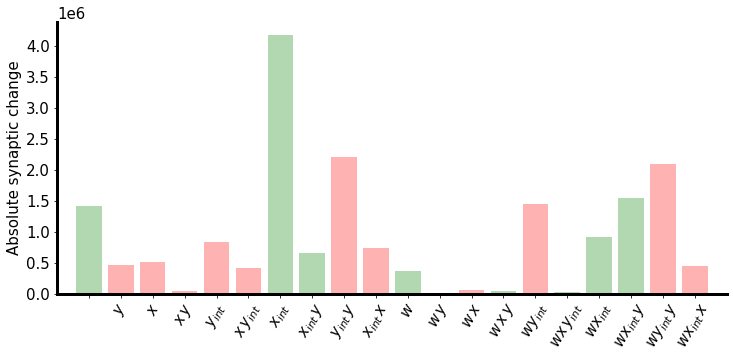

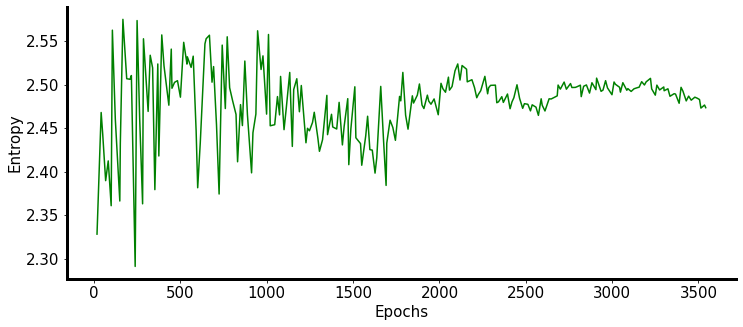

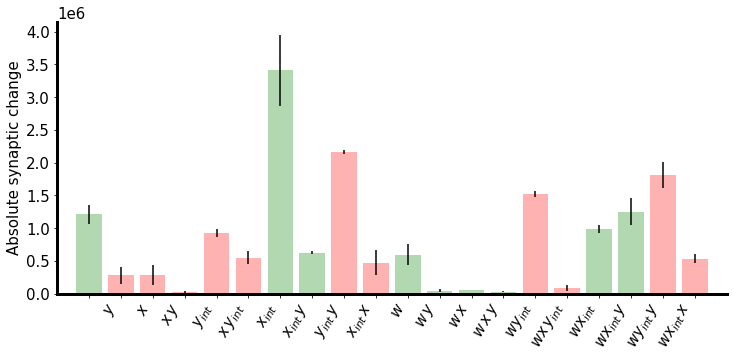

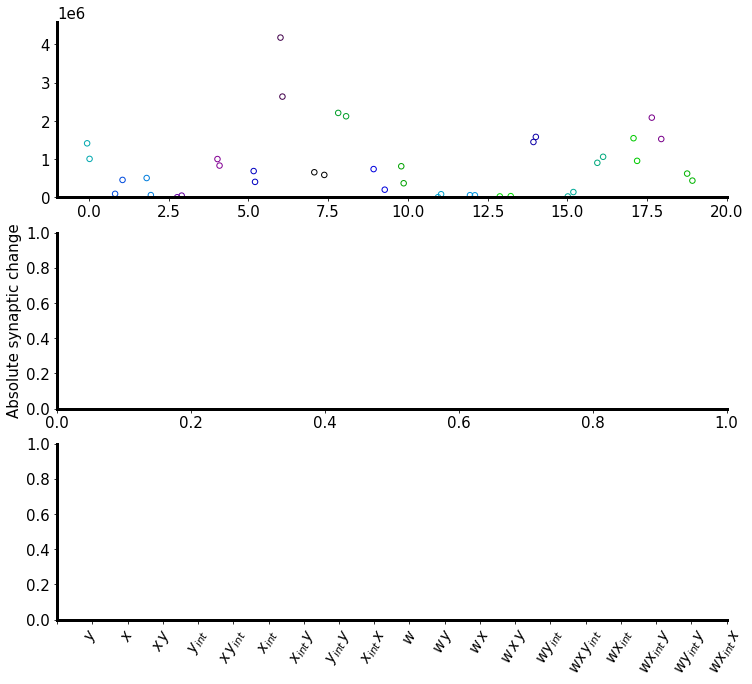

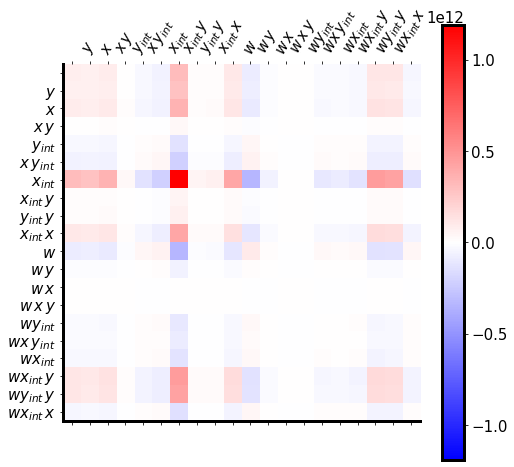

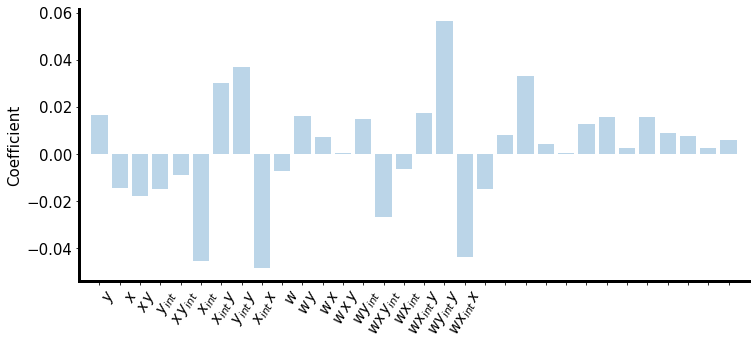

In [11]:
all_files = [
    'seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0007_FRACI_0.75_SEED_4000_2023-04-28_14:10:50.919878',
    'seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.0007_FRACI_0.75_SEED_4001_2023-04-28_14:11:07.550790',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 20, 12, 10, n_categories=1)
    if best_loss_for_f < 1200:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

print(final_plasticity_coef_means)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    colors = np.where(final_plasticity_coef_means > 0, 'green', 'red')
    axs.bar(x, y, alpha=0.3, color=colors)
    axs.errorbar(x, y, yerr=y_err, ls='none', color='black')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

x = np.arange(len(final_plasticity_coef_means))
y = final_plasticity_coef_means
axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
tick_labels = list(rule_names[:len(final_syn_effect_means)]) + ([''] * 12)
axs2.set_xticklabels(tick_labels, rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

[ 0.01219263  0.00662278 -0.00167788  0.00873395 -0.01154088  0.02770271
  0.01536059  0.03114944 -0.01969973 -0.00304556  0.01410426 -0.00248419
 -0.00897152 -0.01463214 -0.02120957 -0.01481203  0.01182646  0.03730677
 -0.01881453 -0.03328137  0.02606946  0.00506951  0.01556597  0.00900927
  0.00070633  0.00190265  0.00559938  0.00881967  0.0023458   0.00909236
  0.00316208  0.02878817]
seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.001_FRACI_0.75_SEED_5000_2023-04-29_12:30:26.223506
[ 0.0469545   0.02013746 -0.07706046  0.02270961 -0.01978476 -0.0594216
  0.00325955  0.08226332 -0.00605764  0.01864863  0.00811411  0.03826392
  0.02349185 -0.00865815 -0.00694385 -0.03576451  0.03908386  0.0243982
 -0.07062376 -0.02228274  0.03810426  0.00857371  0.00050302  0.00096192
  0.03847215  0.03227028  0.01131635  0.00969676  0.00057347  0.00263569
  0.0042777   0.00078319]
seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENA

(-1.0, 32.0)

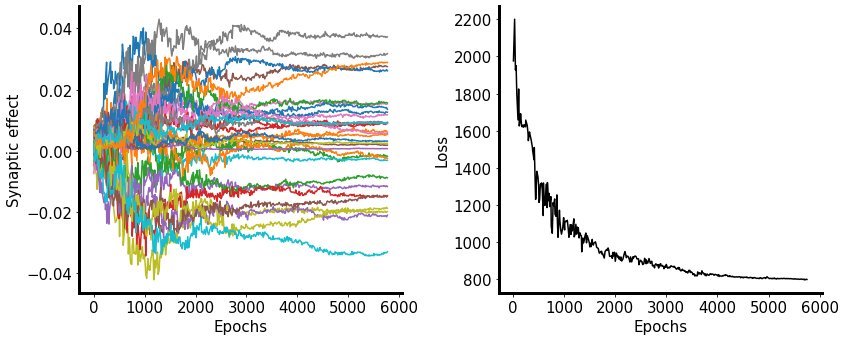

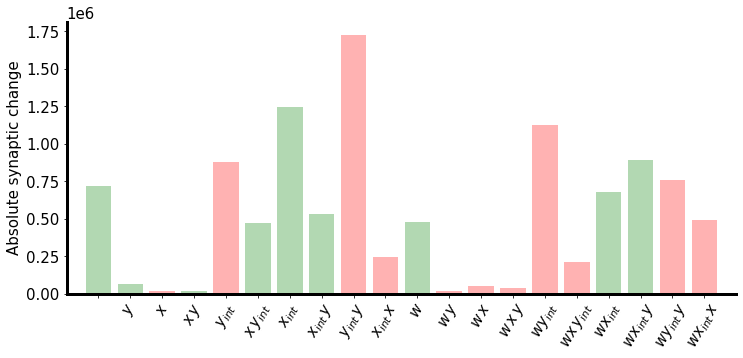

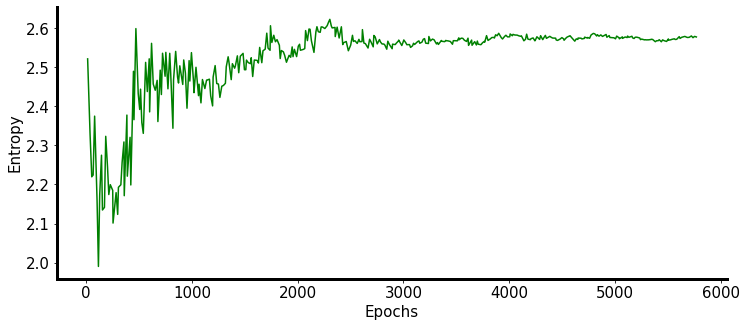

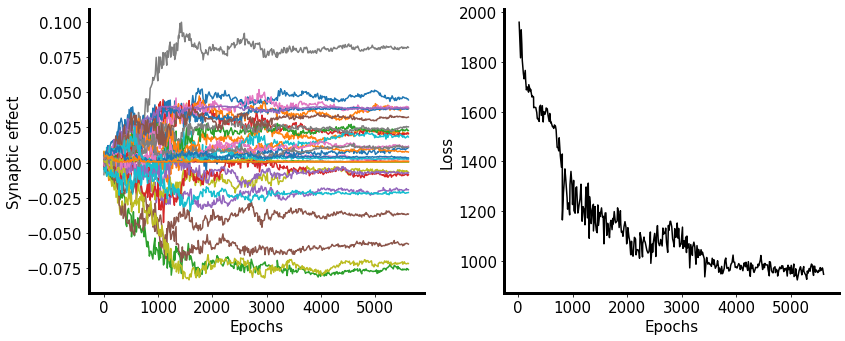

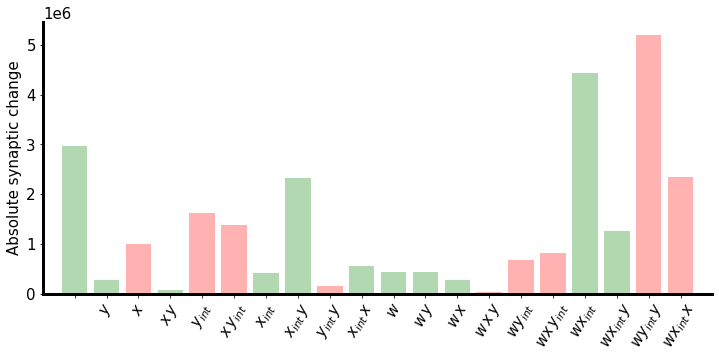

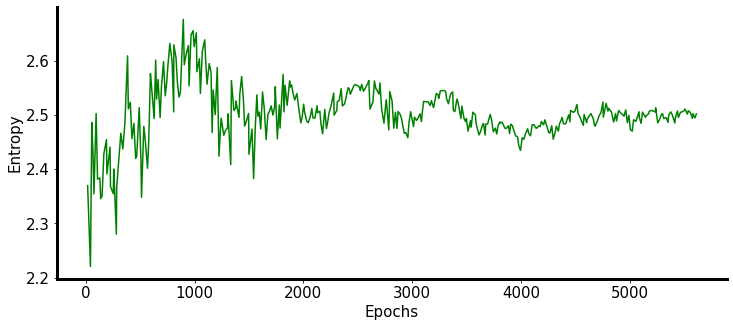

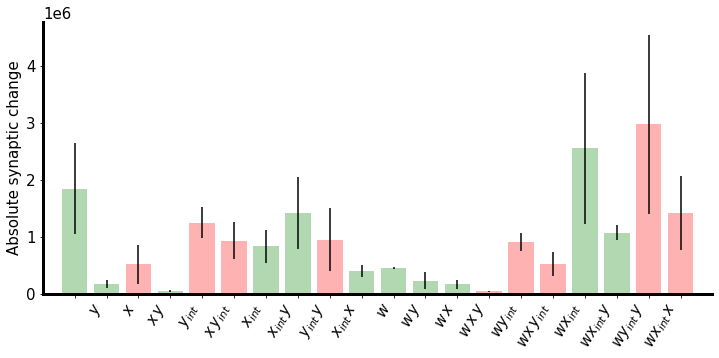

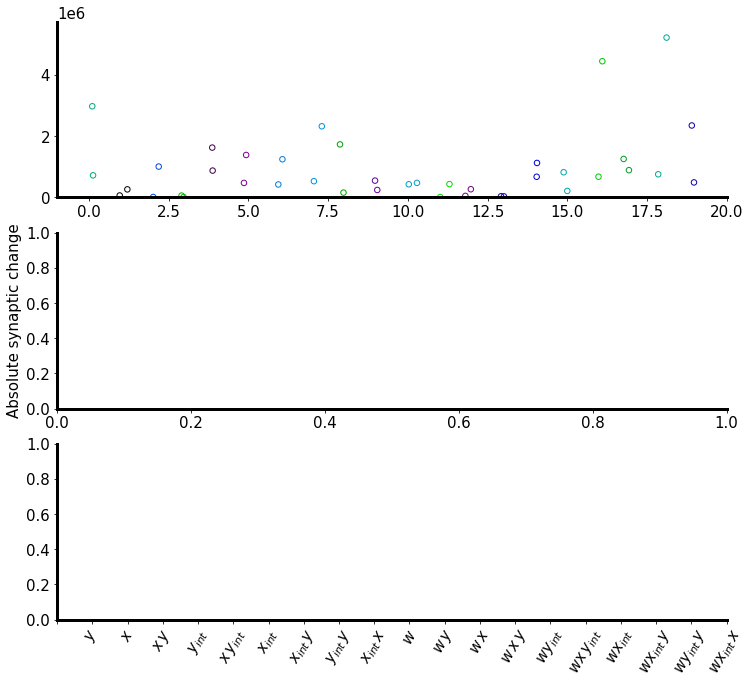

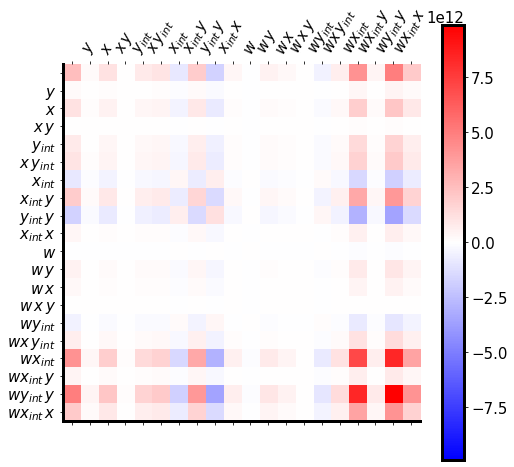

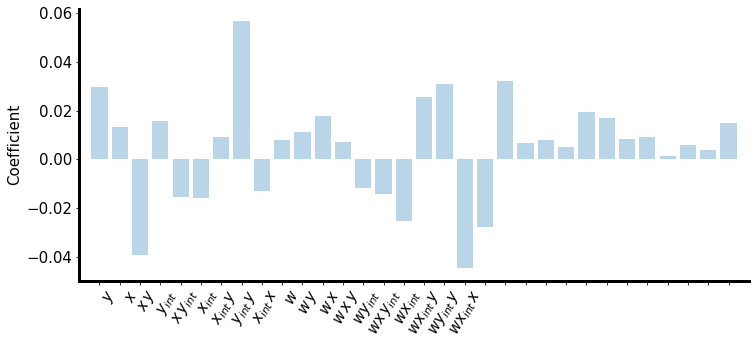

In [10]:
all_files = [
    'seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.001_FRACI_0.75_SEED_5000_2023-04-29_12:30:26.223506',
    'seq_self_org_linearplus_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_CHANGEP_0.001_FRACI_0.75_SEED_5001_2023-04-29_12:31:22.711612',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 20, 12, 10, n_categories=1)
    if best_loss_for_f < 1200:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

print(final_plasticity_coef_means)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    colors = np.where(final_plasticity_coef_means > 0, 'green', 'red')
    axs.bar(x, y, alpha=0.3, color=colors)
    axs.errorbar(x, y, yerr=y_err, ls='none', color='black')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

x = np.arange(len(final_plasticity_coef_means))
y = final_plasticity_coef_means
axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
tick_labels = list(rule_names[:len(final_syn_effect_means)]) + ([''] * 12)
axs2.set_xticklabels(tick_labels, rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

[ 0.02523216 -0.0011456   0.02797905  0.00201571 -0.0180342   0.00799814
 -0.00789353 -0.00191021  0.00397791  0.00443301  0.02177414 -0.02072798
  0.02195343 -0.0173487  -0.00864638  0.00094887 -0.00842261  0.00656561
  0.0072414   0.00329387 -0.00024686  0.00270891  0.01264018 -0.01644651
  0.00934943  0.00100086  0.00102134  0.01731887  0.00104587]
seq_self_org_ee_no_drop_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_DROPP_0.0007_SEED_4000_2023-03-10_21:59:31.233934
[ 0.0179207   0.00180984  0.01080709 -0.02061158  0.01364173  0.0054677
  0.00722222  0.00035693 -0.00873784  0.01696205  0.0210422  -0.01618101
  0.01150259 -0.01661447  0.01267763  0.01299211 -0.02392666 -0.00846119
 -0.01519933  0.00023202 -0.00147175  0.03147177  0.00360447 -0.0315564
  0.00101659  0.00343295  0.00980076  0.00100312  0.00197282]
seq_self_org_ee_no_drop_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_DROPP_0.0007_SEED_4001_2023-03-11_08:58:40.014522
[ 0.

(-1.0, 24.0)

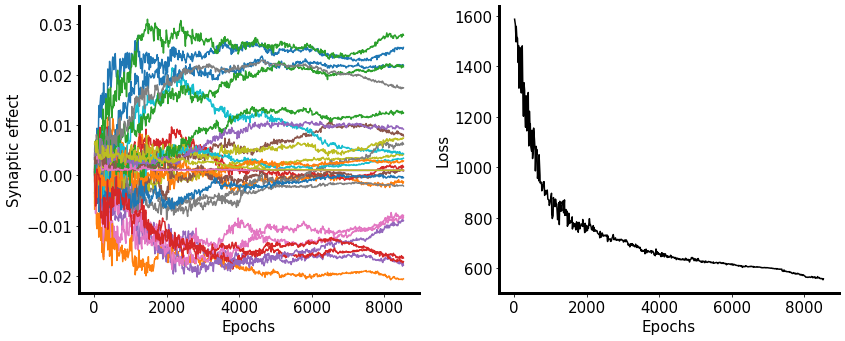

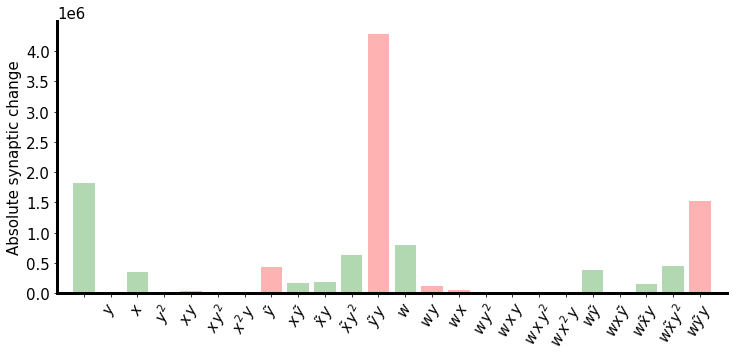

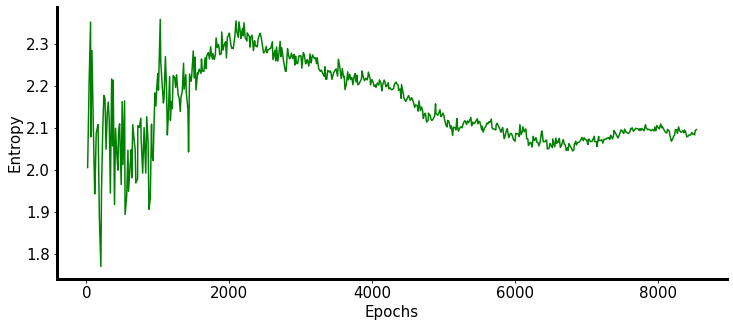

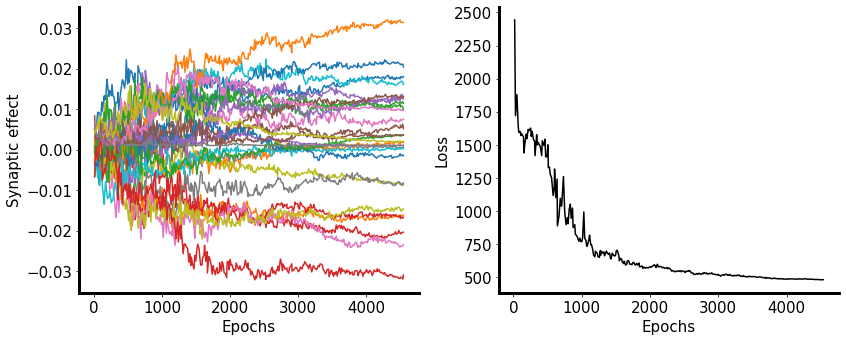

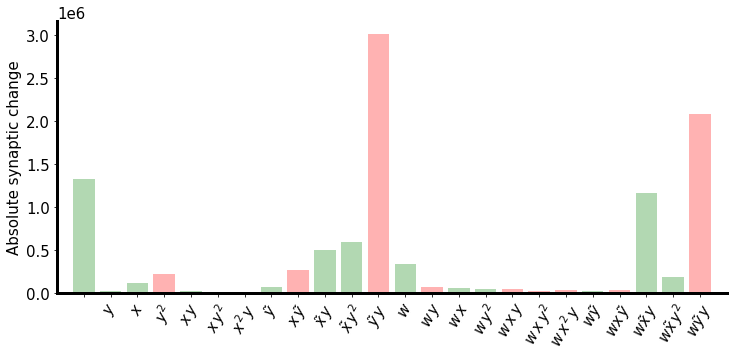

...

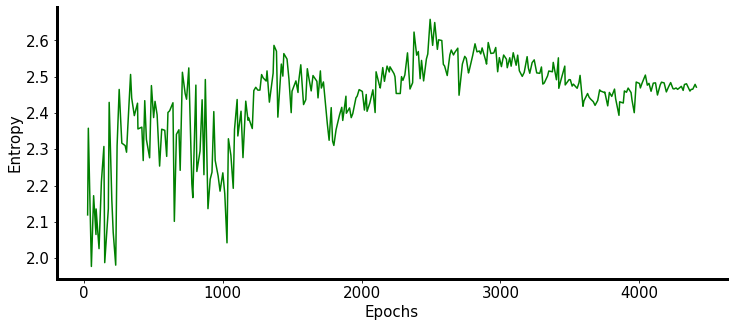

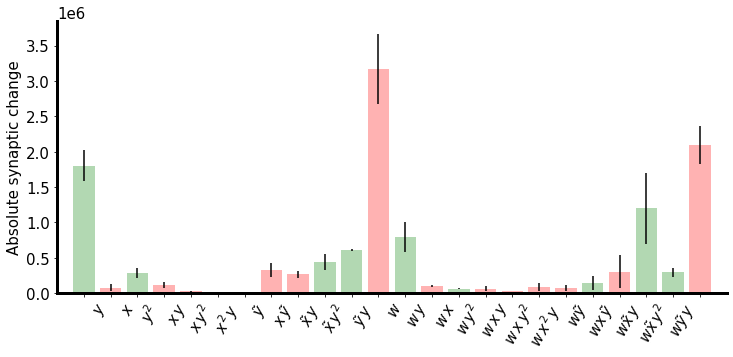

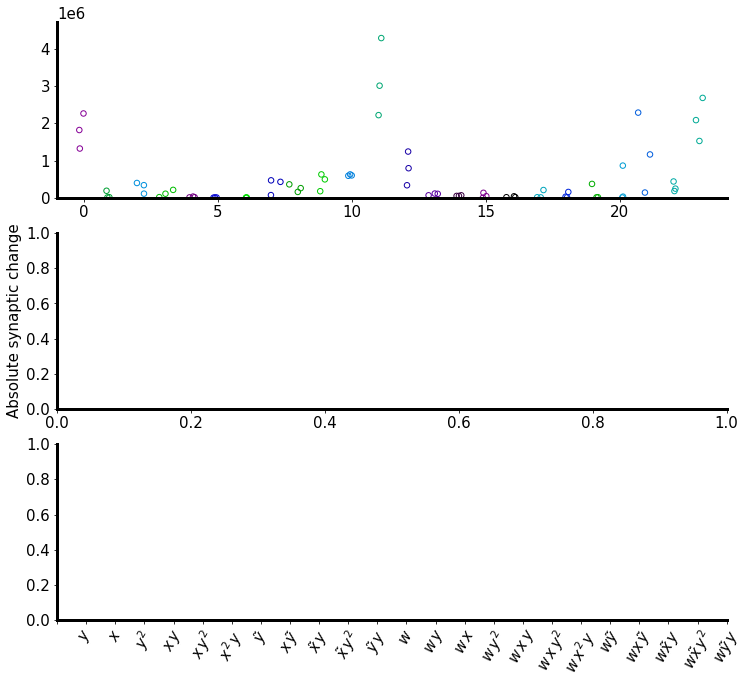

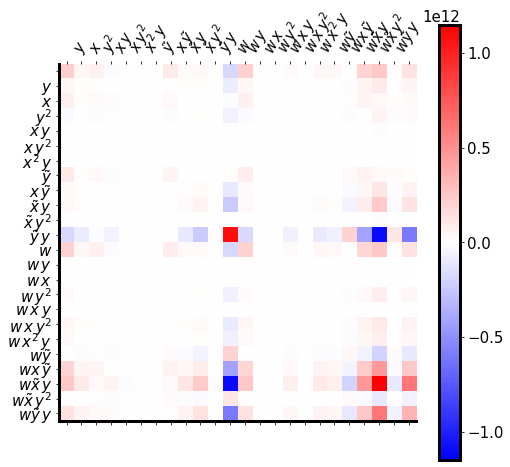

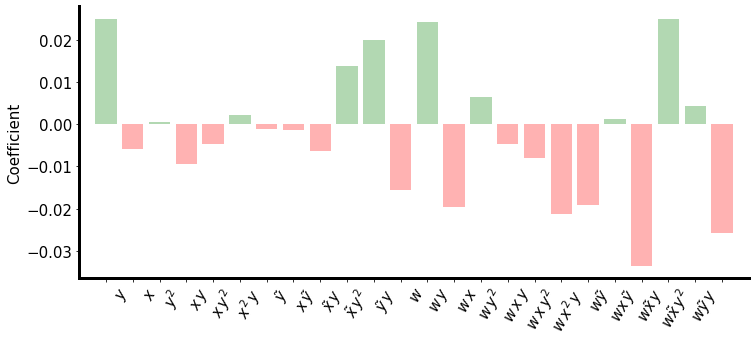

In [28]:
all_files = [
    'seq_self_org_ee_no_drop_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_DROPP_0.0007_SEED_4000_2023-03-10_21:59:31.233934',
    'seq_self_org_ee_no_drop_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_DROPP_0.0007_SEED_4001_2023-03-11_08:58:40.014522',
    'seq_self_org_ee_no_drop_ts_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_DROPP_0.0007_SEED_4002_2023-03-12_10:39:44.092714',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 24, 5, 10, n_categories=1)
    if best_loss_for_f < 1200:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coefs = np.stack(final_plasticity_coefs)
final_plasticity_coef_means = np.mean(final_plasticity_coefs, axis=0)
final_plasticity_coef_stds = np.std(final_plasticity_coefs, axis=0) / np.sqrt(final_plasticity_coefs.shape[0])

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    colors = np.where(final_plasticity_coef_means > 0, 'green', 'red')
    axs.bar(x, y, alpha=0.3, color=colors)
    axs.errorbar(x, y, yerr=y_err, ls='none', color='black')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

final_plasticity_coef_means = final_plasticity_coef_means[:-5]
colors = np.where(final_plasticity_coef_means > 0, 'green', 'red')
x = np.arange(len(final_plasticity_coef_means))
y = final_plasticity_coef_means
y_err = final_plasticity_coef_stds[:-5]
axs2.bar(x, y, alpha=0.3, color=colors)
# axs2.errorbar(x, y, yerr=y_err, ls='none', color='black')
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
tick_labels = list(rule_names[:len(final_syn_effect_means)])
axs2.set_xticklabels(tick_labels, rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

In [ ]:
all_files = [
    'seq_self_org_ee_parallel_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4000_2023-02-17_23:52:57.445464',
    'seq_self_org_ee_parallel_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4001_2023-02-17_23:53:42.738791',
    'seq_self_org_ee_parallel_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4002_2023-02-17_23:53:36.736830',
    'seq_self_org_ee_parallel_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4003_2023-02-17_23:54:04.443885',
    'seq_self_org_ee_parallel_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4004_2023-02-17_23:53:45.709318',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 20, 10, n_categories=1)
    if best_loss_for_f < 400:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs2.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4000_2023-02-17_23:57:56.175194
seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4001_2023-02-17_23:57:30.503480
seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4002_2023-02-17_23:57:48.737290
seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4003_2023-02-18_04:40:53.374494
seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4004_2023-02-19_12:55:12.249400


(-1.0, 20.0)

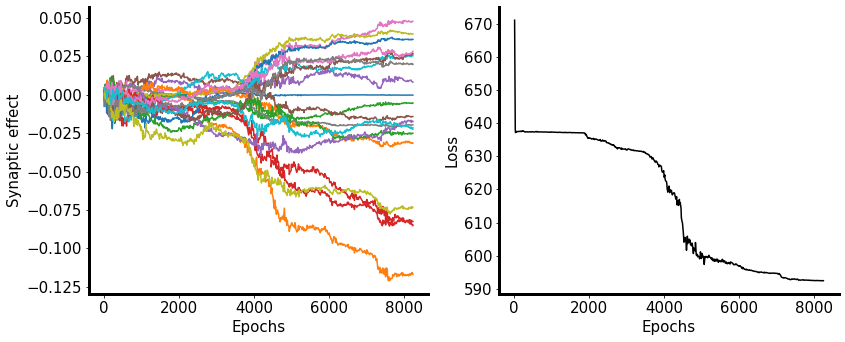

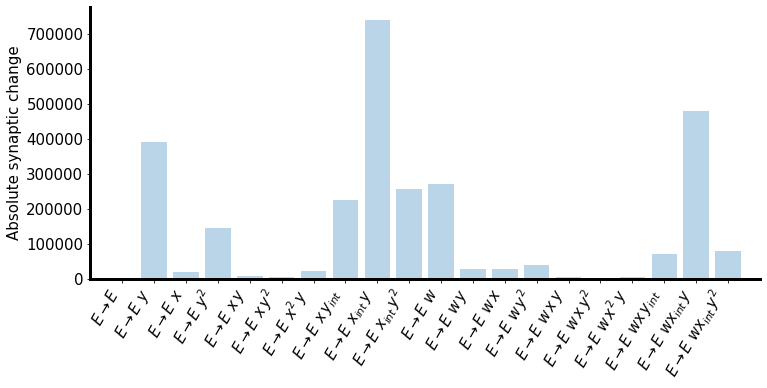

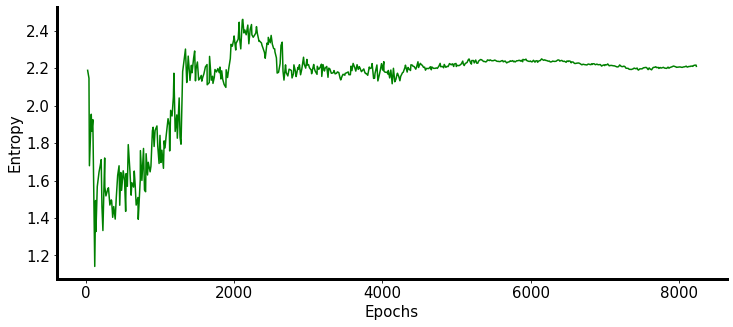

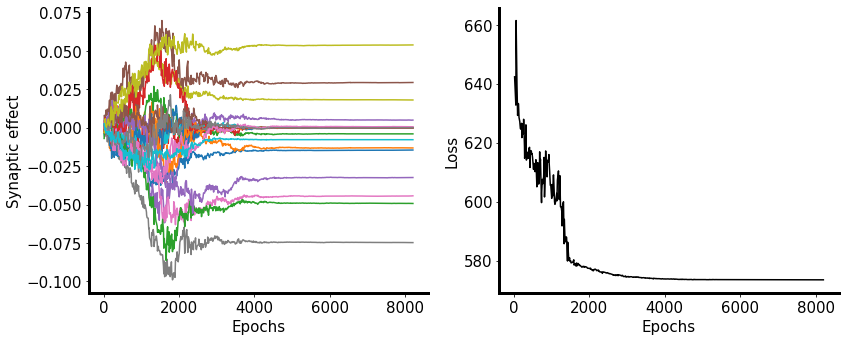

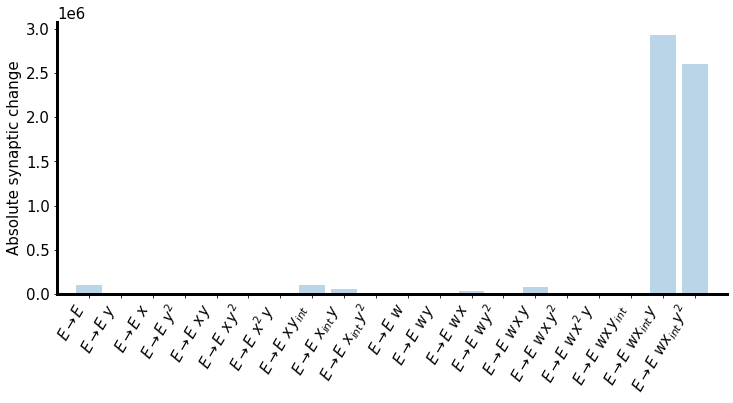

...

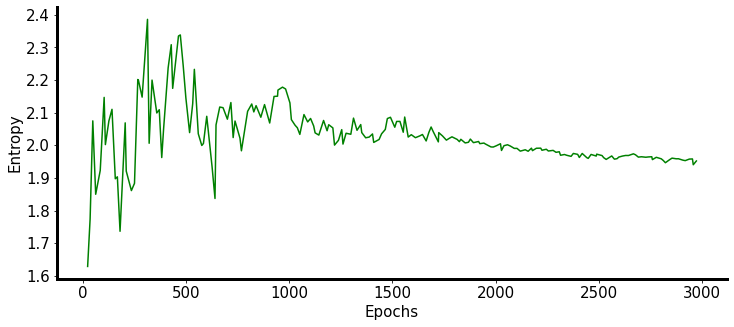

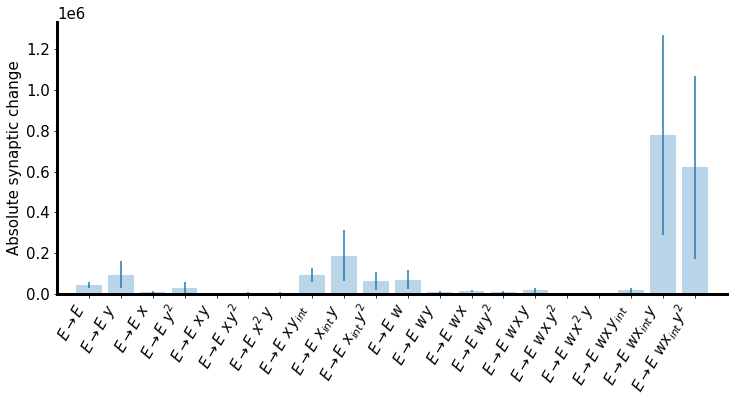

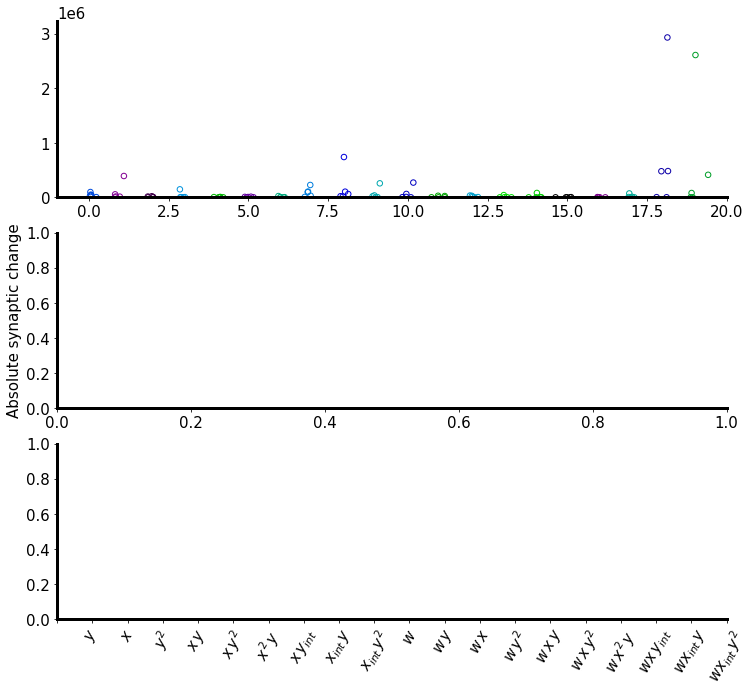

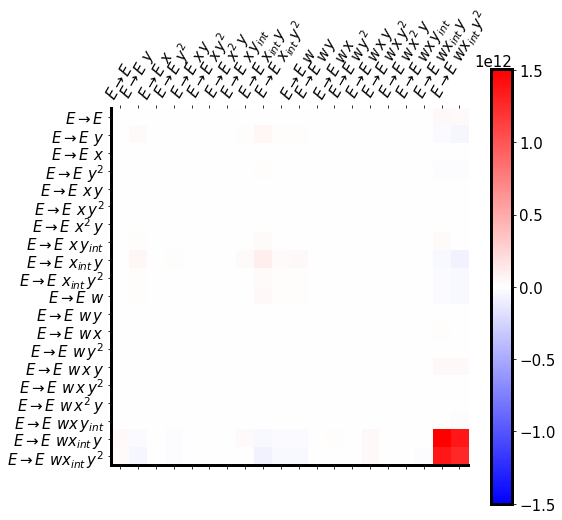

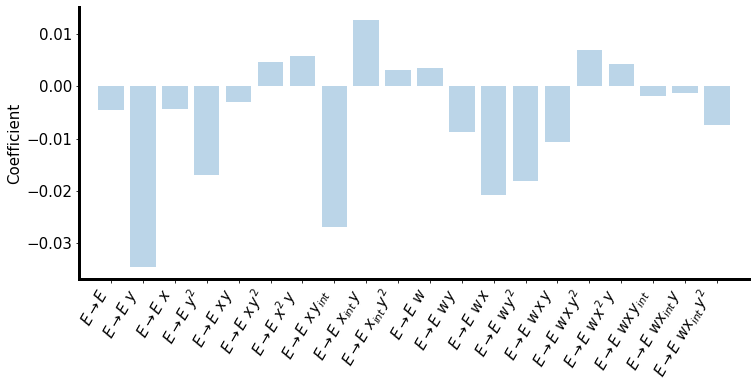

In [8]:
all_files = [
    'seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4000_2023-02-17_23:57:56.175194',
    'seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4001_2023-02-17_23:57:30.503480',
    'seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4002_2023-02-17_23:57:48.737290',
    'seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4003_2023-02-18_04:40:53.374494',
    'seq_self_org_ee_dropped_10_STD_EXPL_0.003_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_4004_2023-02-19_12:55:12.249400',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 20, 10, n_categories=1)
    if best_loss_for_f < 2000:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs2.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

seq_self_org_ee_dropped_5_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2000_2023-02-15_09:02:54.765145
seq_self_org_ee_dropped_5_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2001_2023-02-15_09:04:43.717705
seq_self_org_ee_dropped_5_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2002_2023-02-15_09:05:20.681886


(-1.0, 20.0)

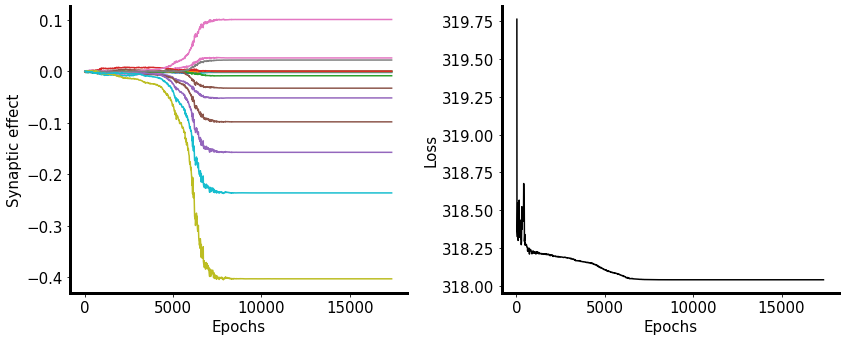

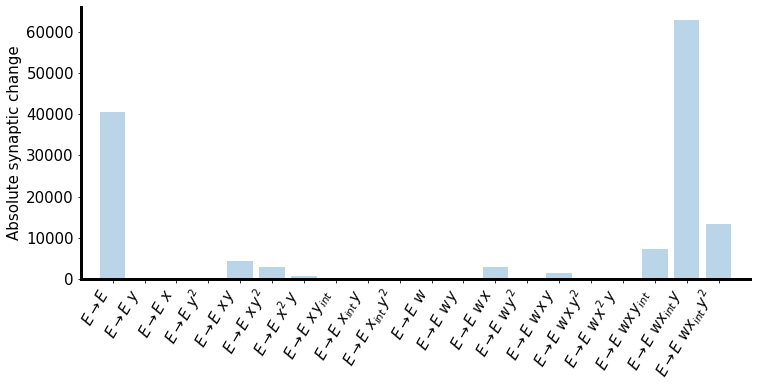

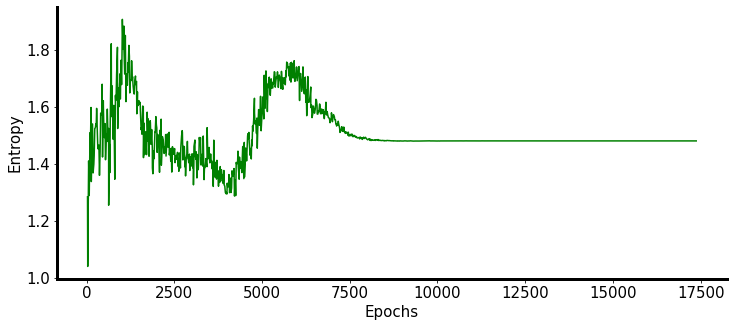

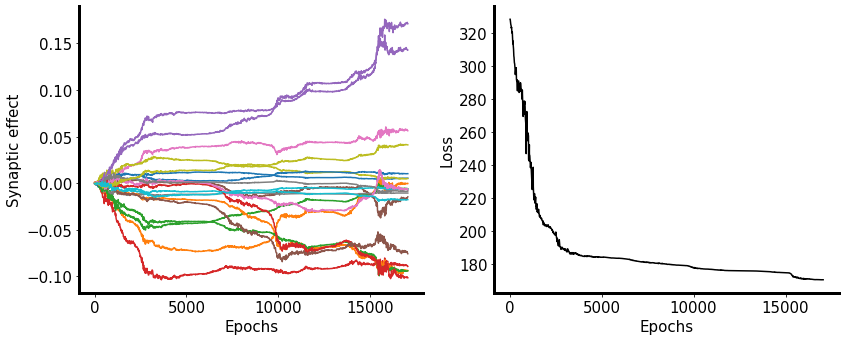

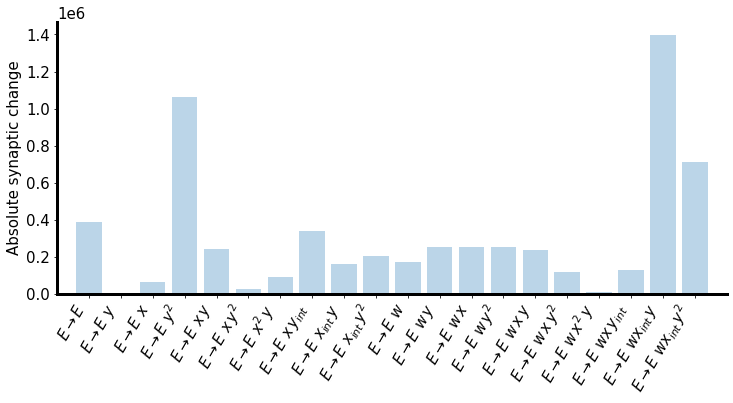

...

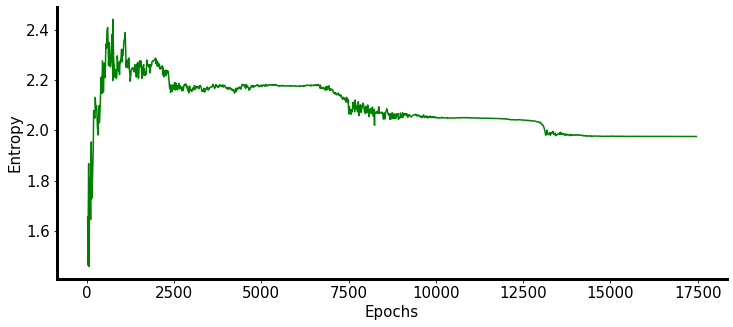

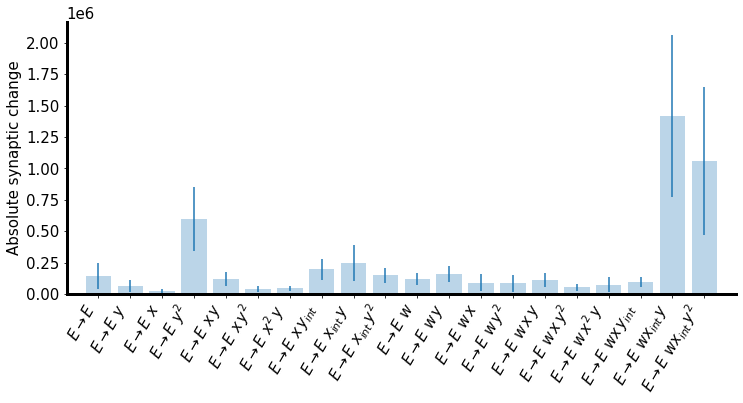

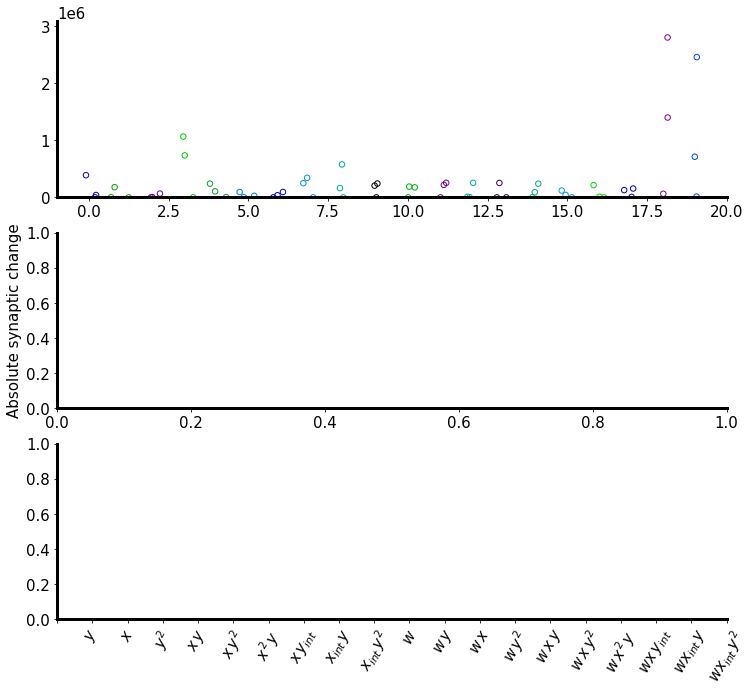

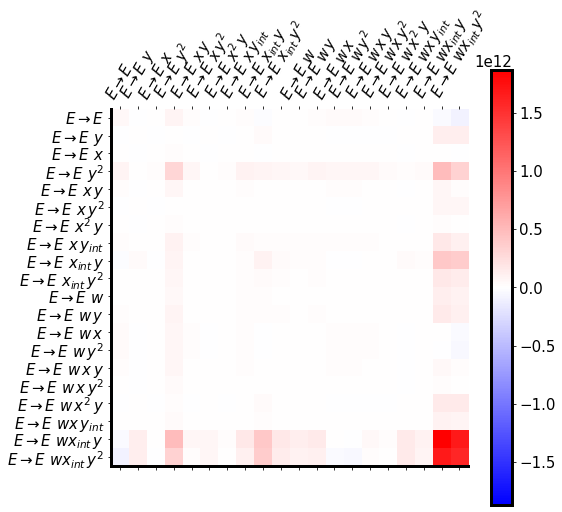

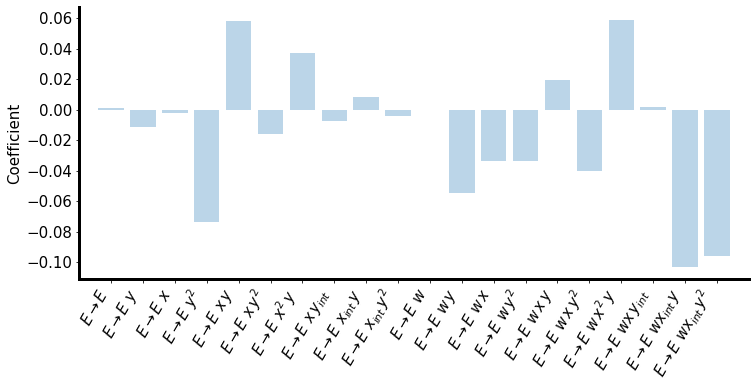

In [6]:
all_files = [
    'seq_self_org_ee_dropped_5_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2000_2023-02-15_09:02:54.765145',
    'seq_self_org_ee_dropped_5_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2001_2023-02-15_09:04:43.717705',
    'seq_self_org_ee_dropped_5_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2002_2023-02-15_09:05:20.681886'
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 20, 5, n_categories=1)
    if best_loss_for_f < 1200:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs2.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

seq_self_org_det_input_30_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2000_2023-02-07_14:14:46.169296
seq_self_org_det_input_30_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2001_2023-02-07_14:15:19.091464
seq_self_org_det_input_30_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2002_2023-02-08_23:45:54.532839
seq_self_org_det_input_30_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2003_2023-02-08_23:46:09.944950


(-1.0, 20.0)

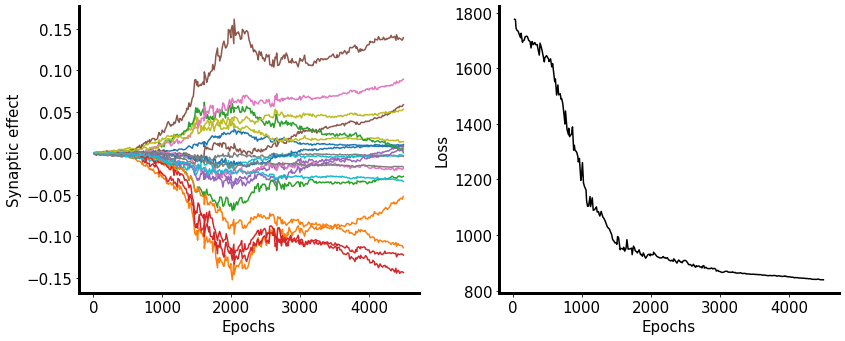

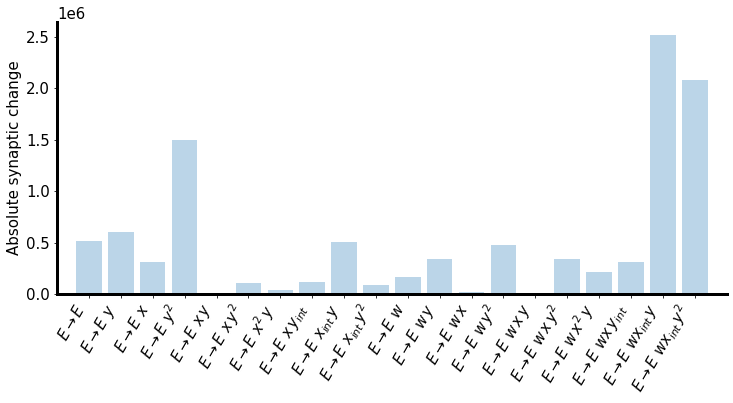

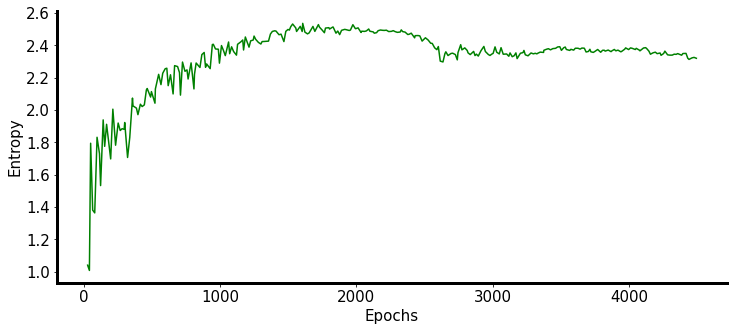

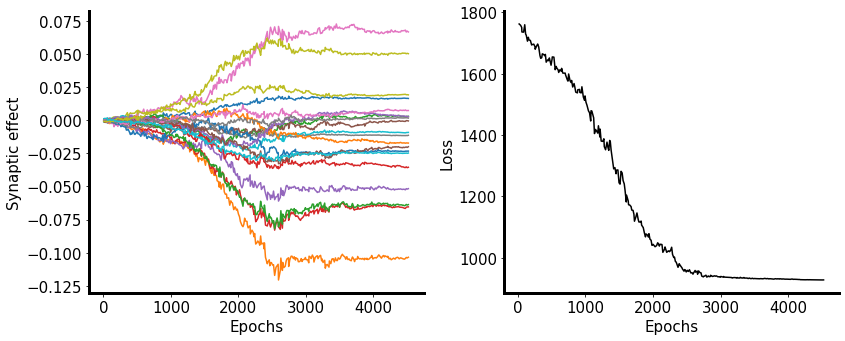

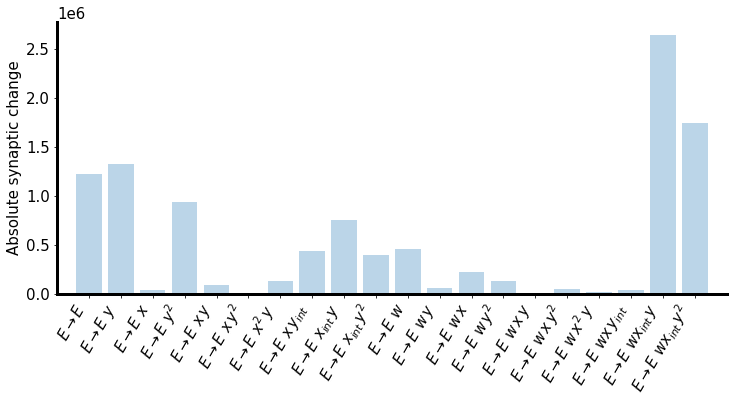

...

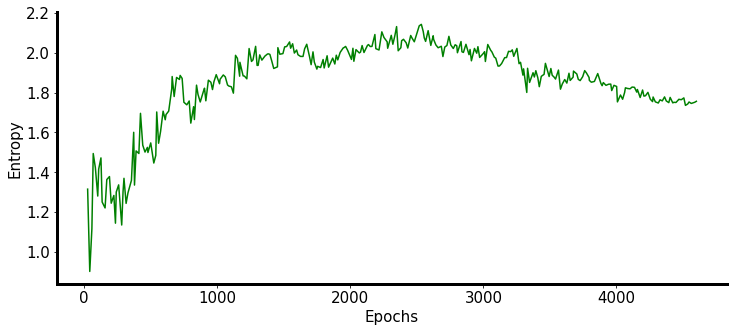

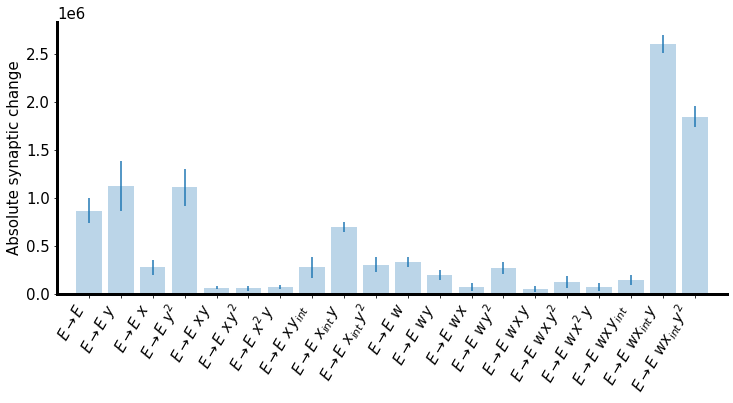

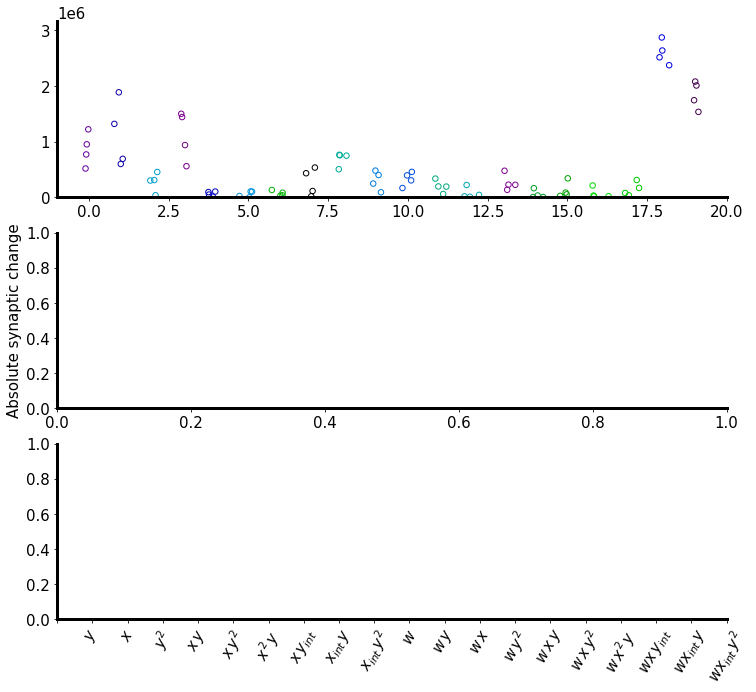

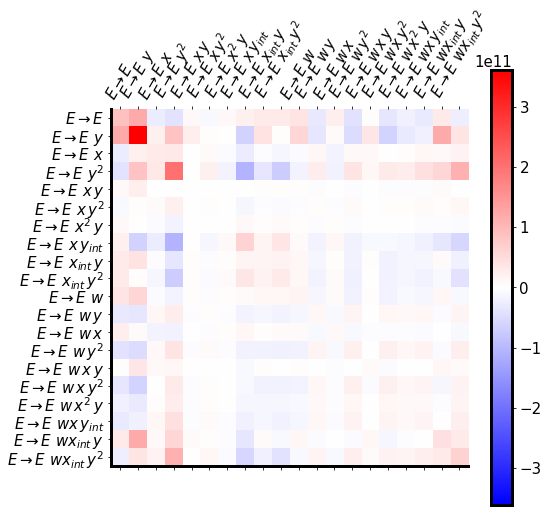

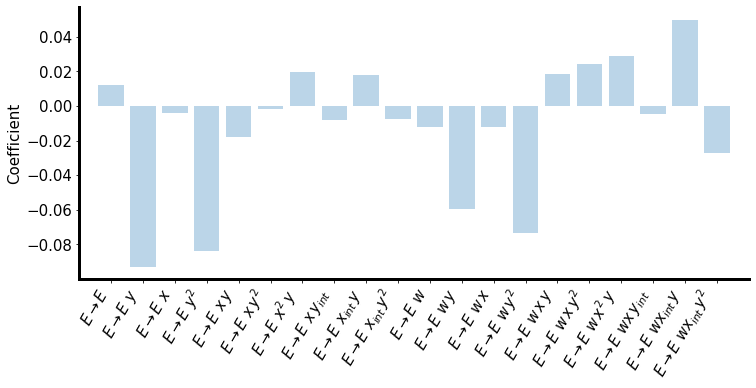

In [4]:
all_files = [
    'seq_self_org_det_input_30_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2000_2023-02-07_14:14:46.169296',
    'seq_self_org_det_input_30_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2001_2023-02-07_14:15:19.091464',
    'seq_self_org_det_input_30_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2002_2023-02-08_23:45:54.532839',
    'seq_self_org_det_input_30_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2003_2023-02-08_23:46:09.944950',
    'seq_self_org_det_input_30_STD_EXPL_0.0005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2004_2023-02-08_23:46:03.480356',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 20, 30, n_categories=1)
    if best_loss_for_f < 1200:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs2.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

seq_self_org_det_input_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2000_2023-02-08_23:44:28.260685
seq_self_org_det_input_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2001_2023-02-08_23:44:46.621089


(-1.0, 20.0)

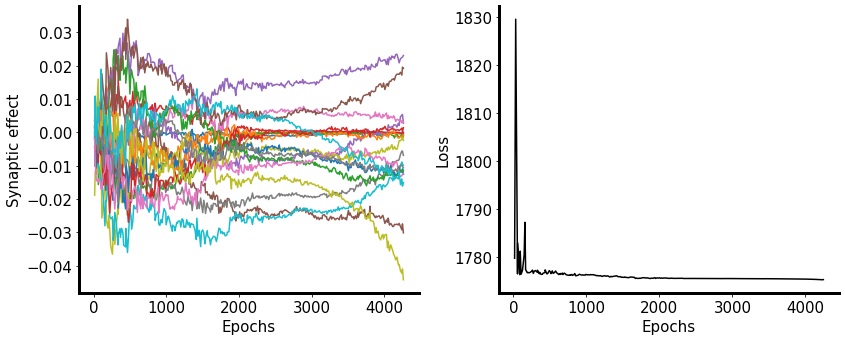

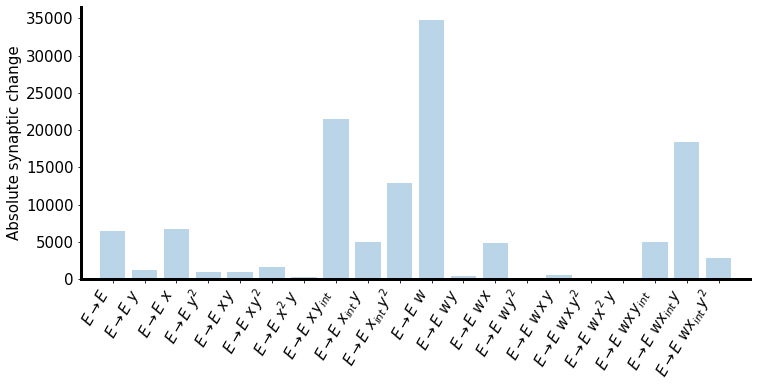

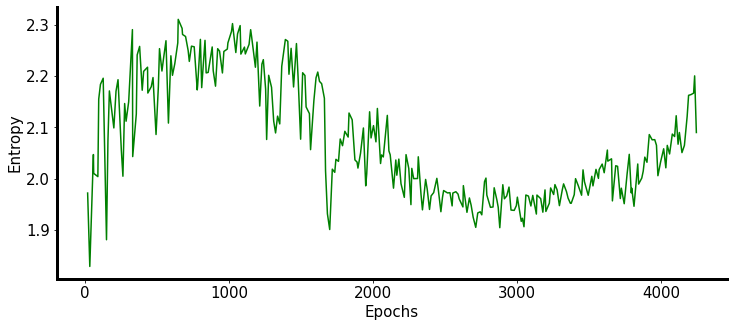

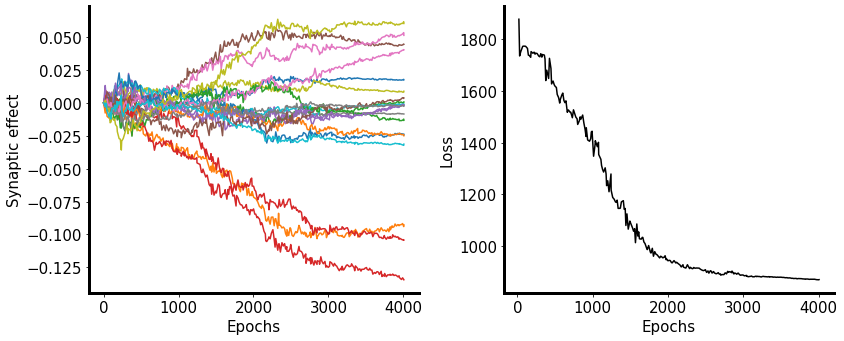

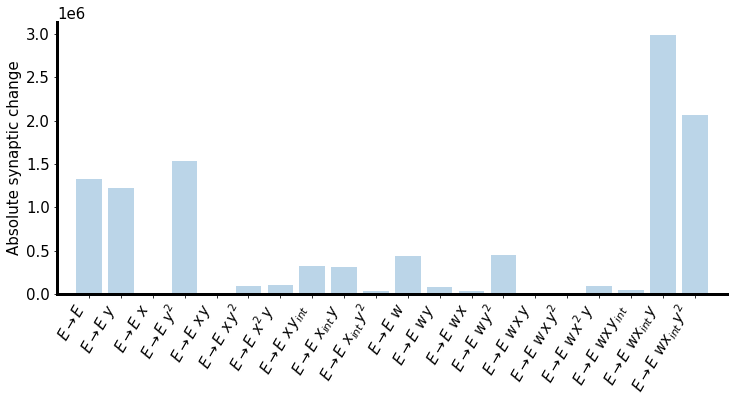

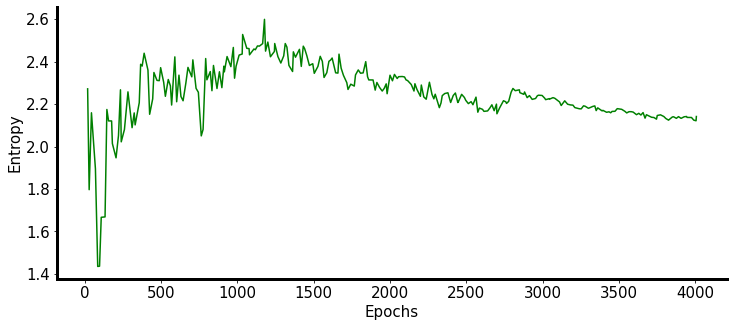

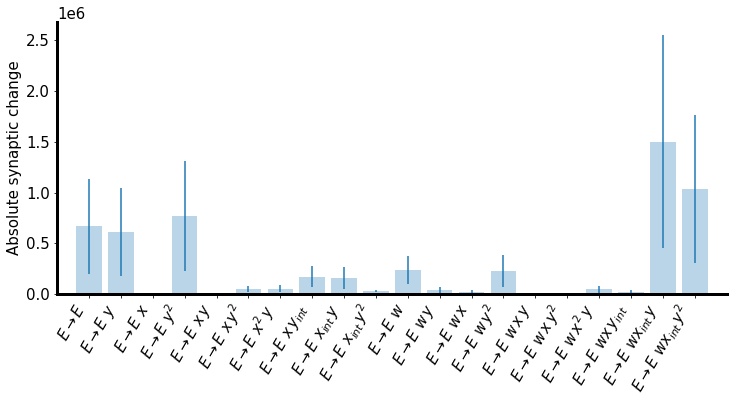

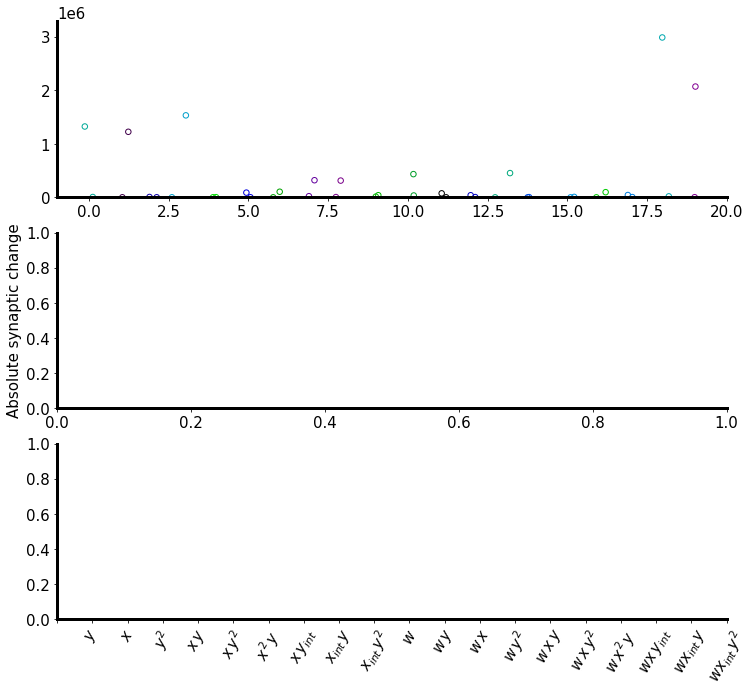

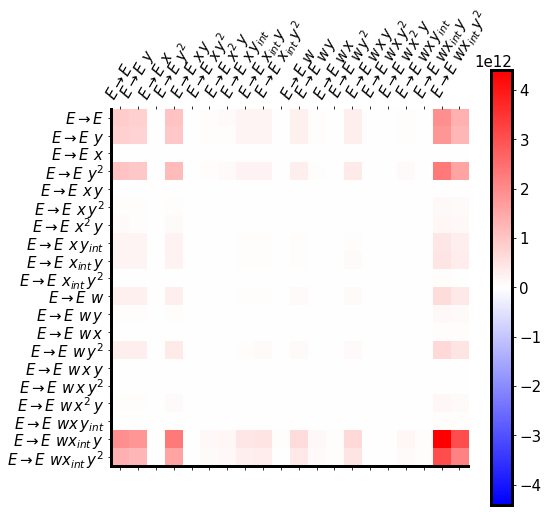

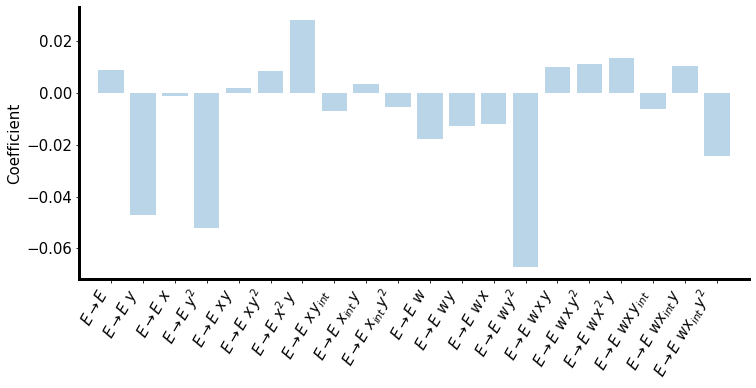

In [5]:
all_files = [
    'seq_self_org_det_input_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2000_2023-02-08_23:44:28.260685',
    'seq_self_org_det_input_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_SEED_2001_2023-02-08_23:44:46.621089',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 20, 30, n_categories=1)
    if best_loss_for_f < 10000:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs2.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-30_14:28:19.348344
seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-30_22:35:39.275445
seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-30_22:46:30.191639
seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-31_00:22:38.433098
seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-31_00:22:39.036128
seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-31_00:34:04.230647


(-1.0, 18.0)

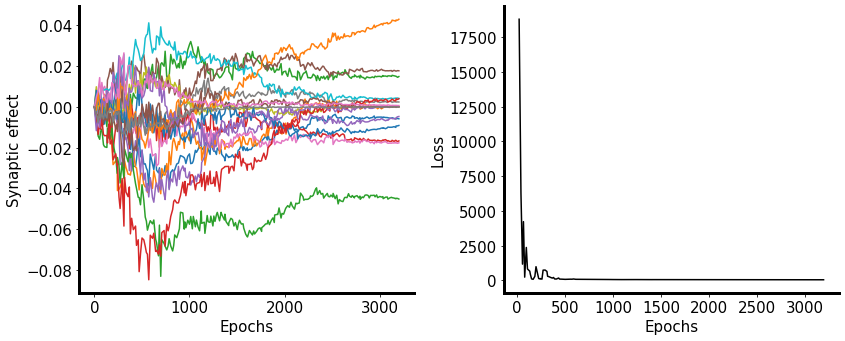

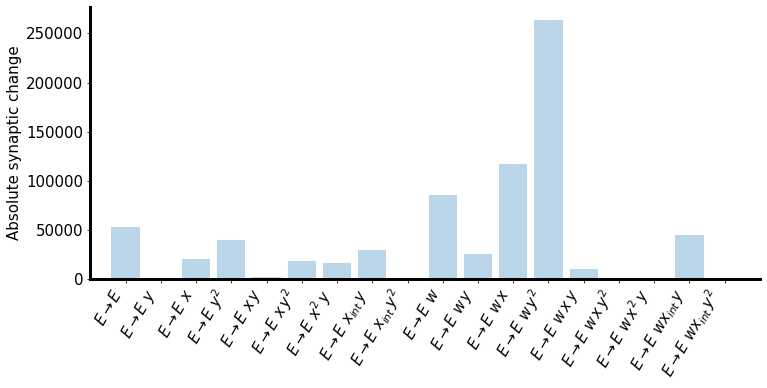

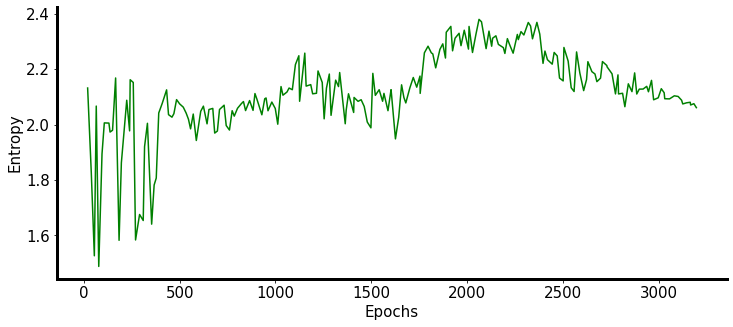

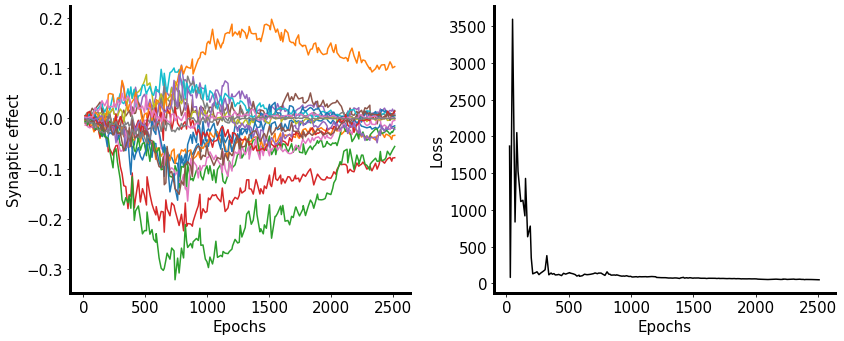

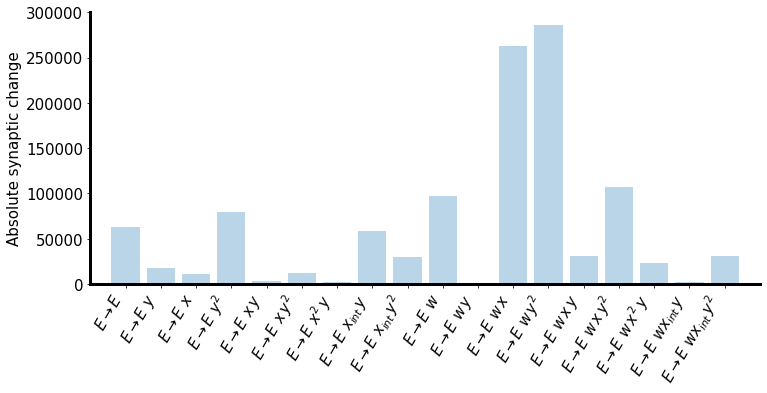

...

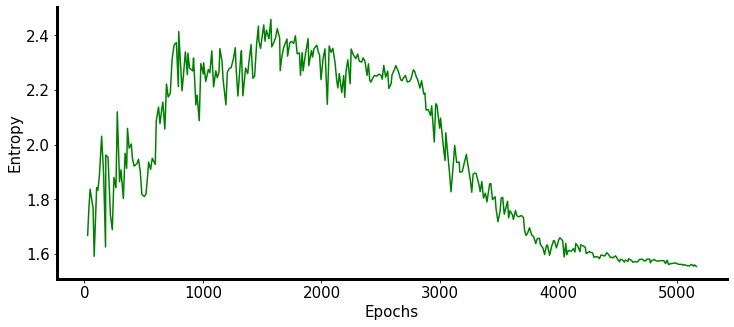

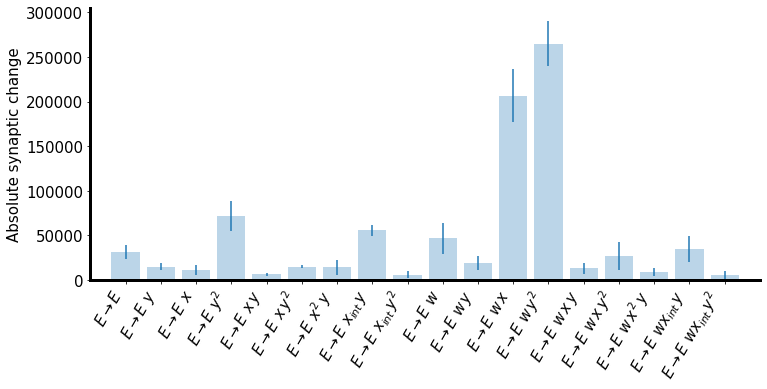

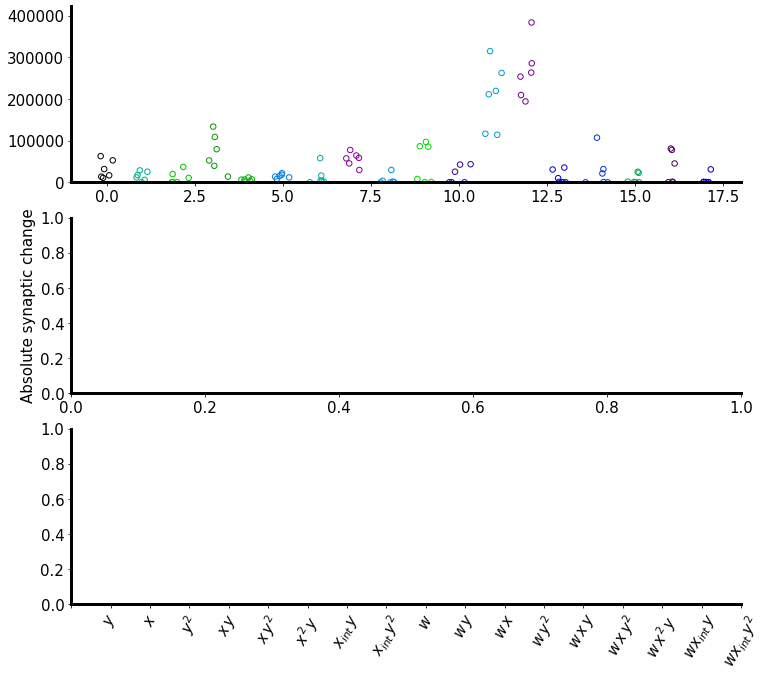

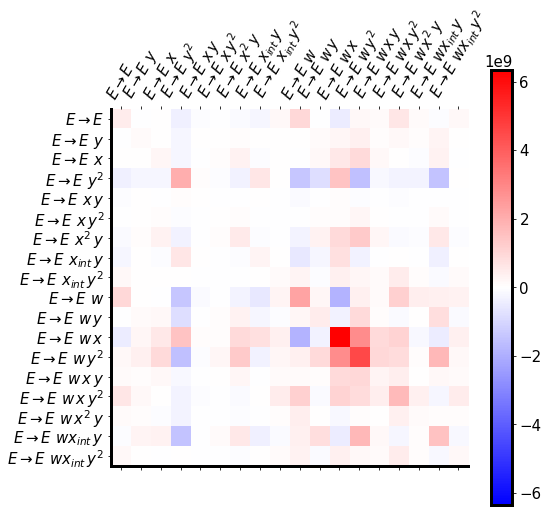

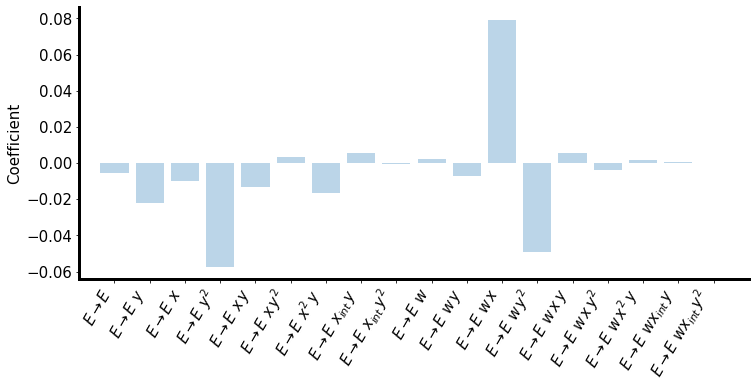

In [5]:
all_files = [
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-30_14:28:19.348344',
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-30_22:35:39.275445',
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-30_22:46:30.191639',
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-31_00:22:38.433098',
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-31_00:22:39.036128',
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_1_2023-01-31_00:34:04.230647',
]

final_syn_effects = []
final_plasticity_coefs = []


for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 18, 30, n_categories=1)
    if best_loss_for_f < 100:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs2.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2000_2023-02-02_13:58:16.139743
seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2001_2023-02-02_13:59:33.906645
seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2002_2023-02-02_14:00:02.045293
seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2003_2023-02-02_14:00:29.670920
seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2004_2023-02-02_23:39:27.006942


(-1.0, 18.0)

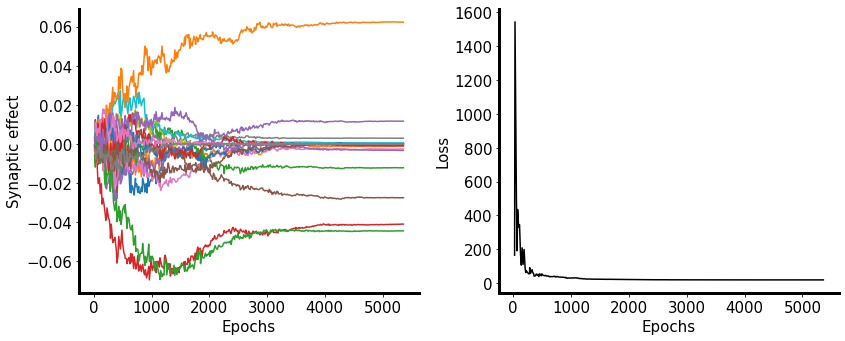

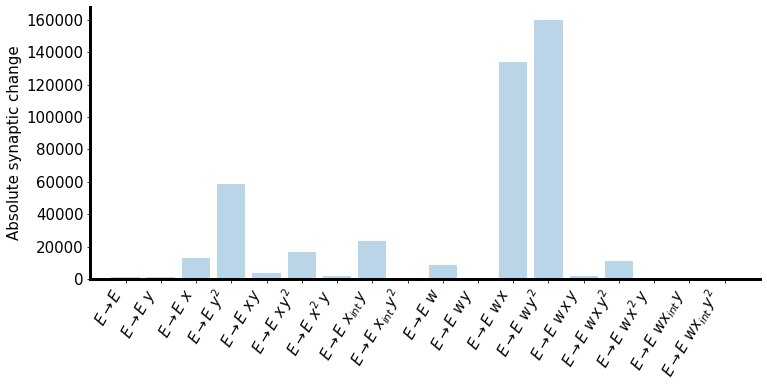

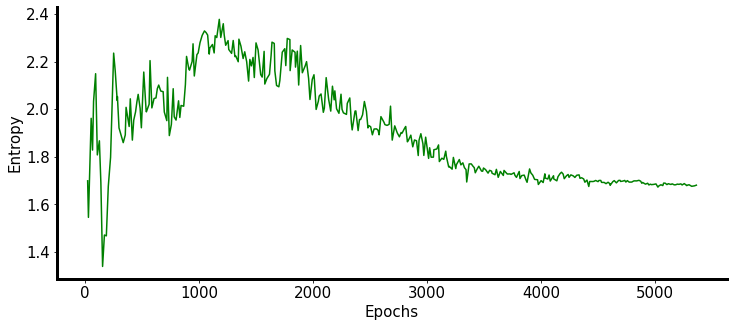

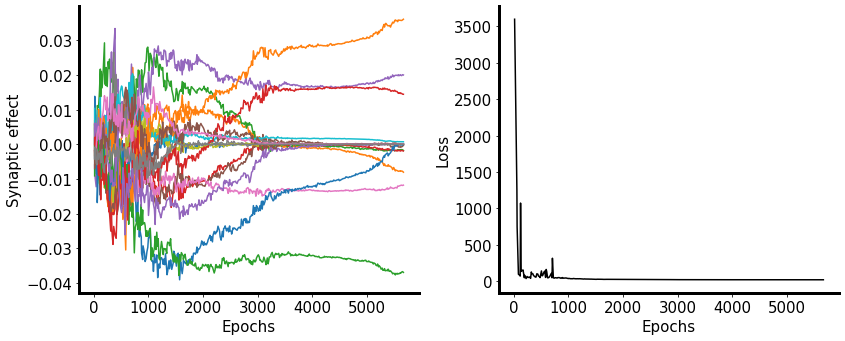

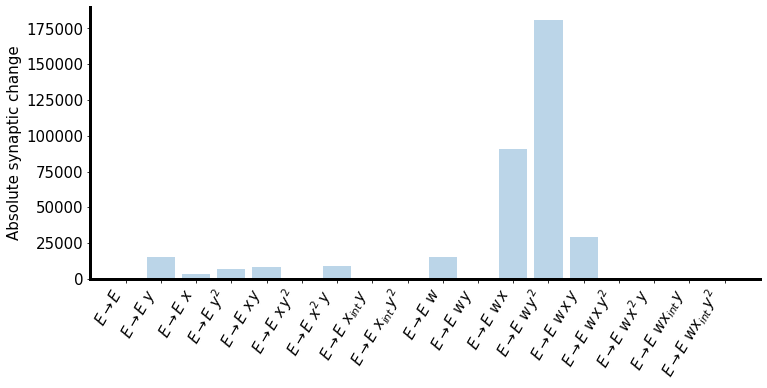

...

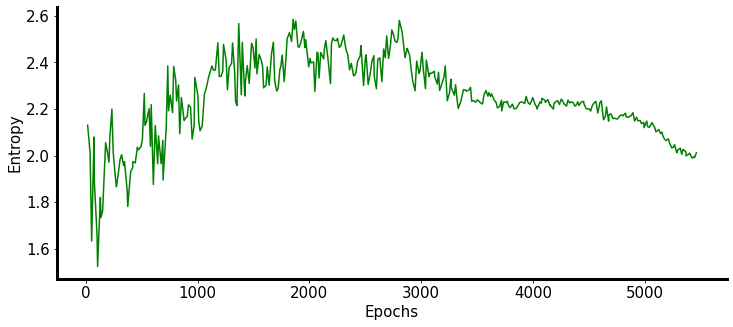

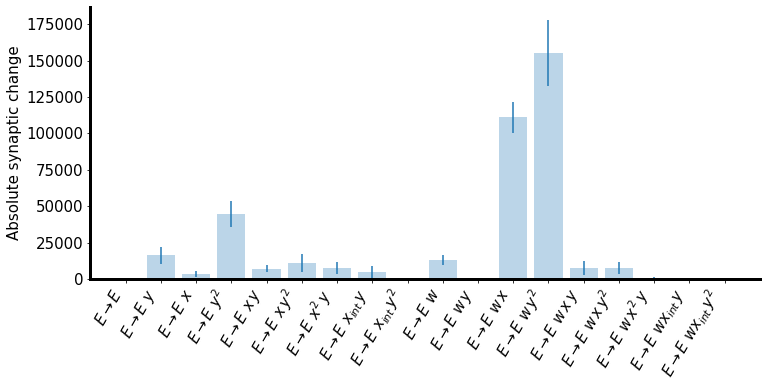

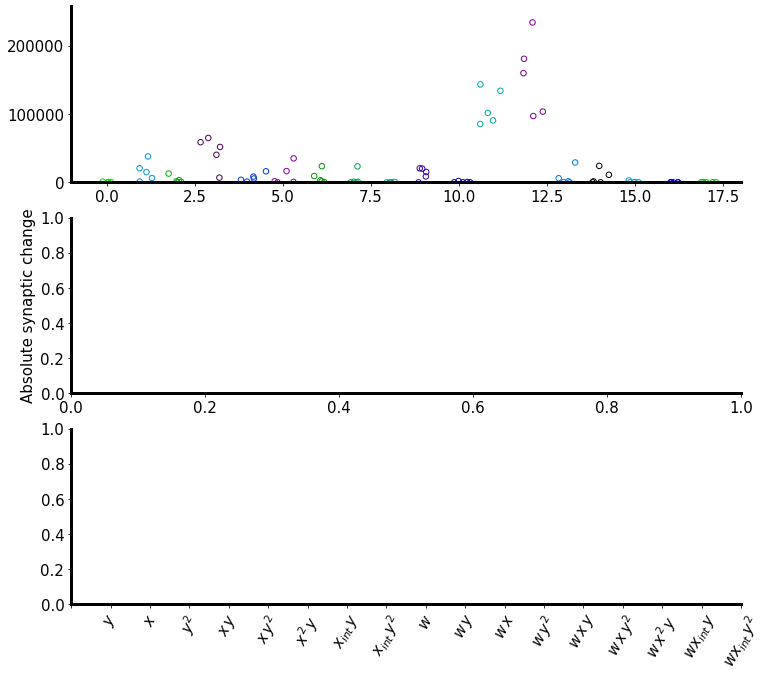

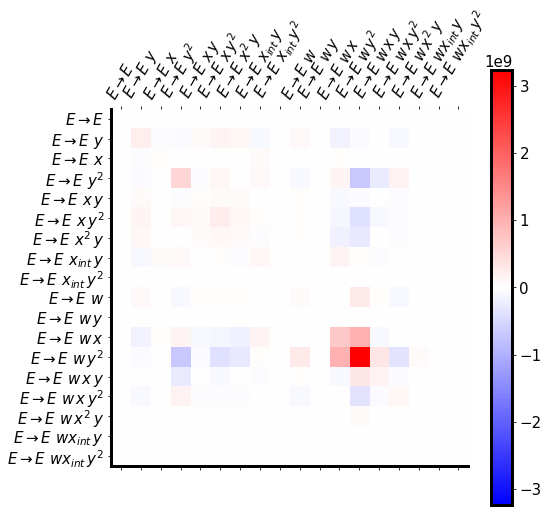

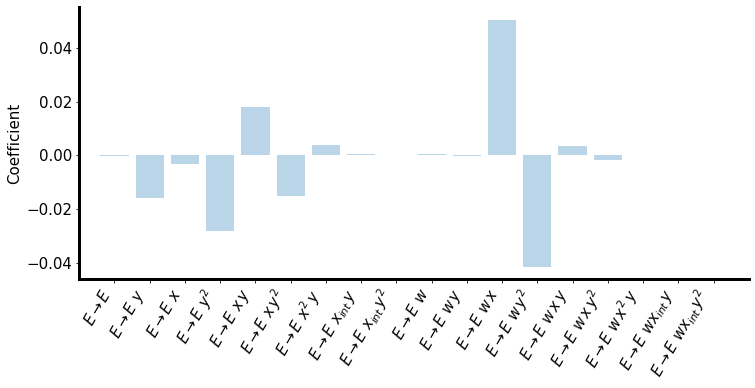

In [6]:
all_files = [
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2000_2023-02-02_13:58:16.139743',
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2001_2023-02-02_13:59:33.906645',
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2002_2023-02-02_14:00:02.045293',
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2003_2023-02-02_14:00:29.670920',
    'seq_ee_jitter_pen_rescaled_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_ACT_PEN_0_SEED_2004_2023-02-02_23:39:27.006942',
]

final_syn_effects = []
final_plasticity_coefs = []


for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 18, 30, n_categories=1)
    if best_loss_for_f < 100:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)

final_syn_effects = np.stack(final_syn_effects)
final_syn_effect_means = np.mean(final_syn_effects, axis=0)
final_syn_effect_stds = np.std(final_syn_effects, axis=0) / np.sqrt(final_syn_effects.shape[0])

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot the synaptic effects of each plasticity rule as scatter plot
scale = 2
fig, axs = plt.subplots(3, 1, figsize=(6 * scale, 5.5 * scale))
format_axs(axs)

cmap = matplotlib.cm.get_cmap('nipy_spectral')
colors = [cmap(x) for x in np.linspace(0, 0.55, final_syn_effects.shape[1])]
np.random.shuffle(colors)

max_val = 0
for i in range(n_categories):
    for j in range(partial_rules_len):
        x = i * partial_rules_len + j
        y = final_syn_effects[:, x]
        axs[i].scatter(j * np.ones(final_syn_effects.shape[0]) + np.random.normal(0, 0.15, final_syn_effects.shape[0]), y, s=30, facecolors='none', edgecolors=colors[j], marker='o')
        
        if np.max(y) > max_val:
            max_val = np.max(y)
    axs[i].set_xlim(-1, partial_rules_len)
    if i < n_categories - 1:
        axs[i].set_xticks([])
        
axs[2].set_xticklabels(general_rule_names, rotation=60)
axs[2].set_xticks(np.arange(partial_rules_len))

axs[1].set_ylabel('Absolute synaptic change')

for i in range(n_categories):
    axs[i].set_ylim(0, max_val * 1.1)

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
format_axs(axs)
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names[:len(final_syn_effect_means)], rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs2)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs2.set_xticklabels(rule_names[:len(final_syn_effect_means)], rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))

seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:03.835156
seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:04.704892
seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:17.223324
seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:35.703655
seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:35.703661
seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:44.629392
seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:44.629779
seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:58.197033
seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_

(-1.0, 42.0)

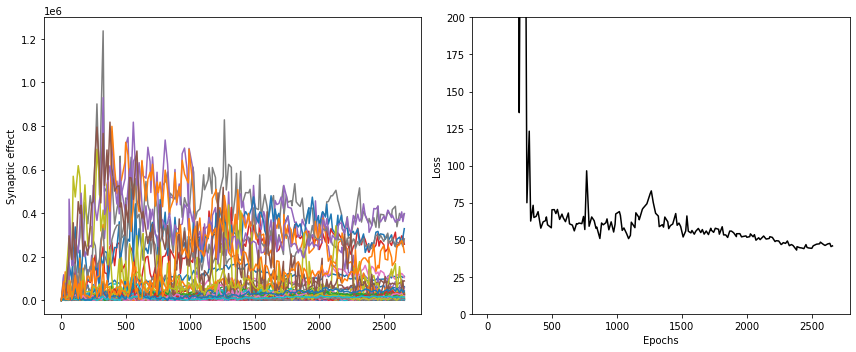

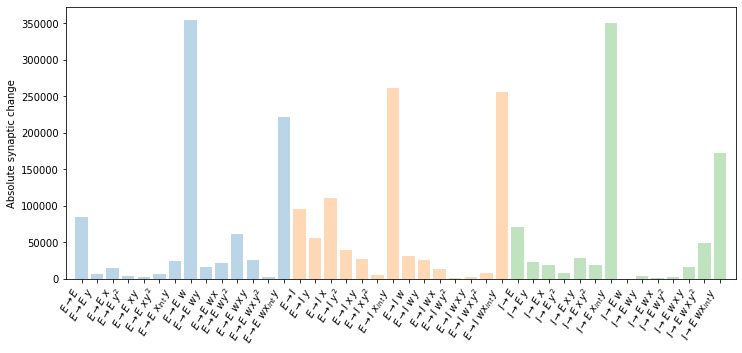

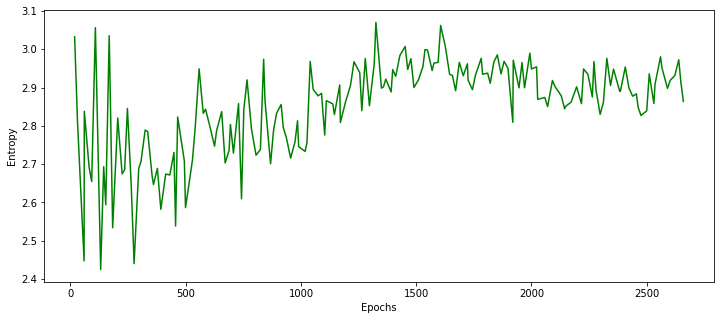

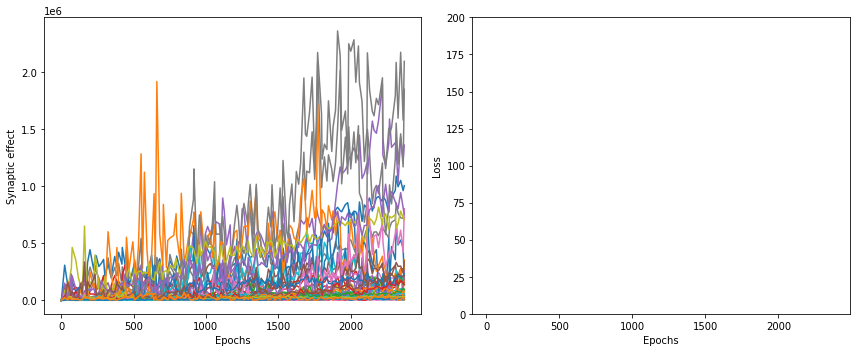

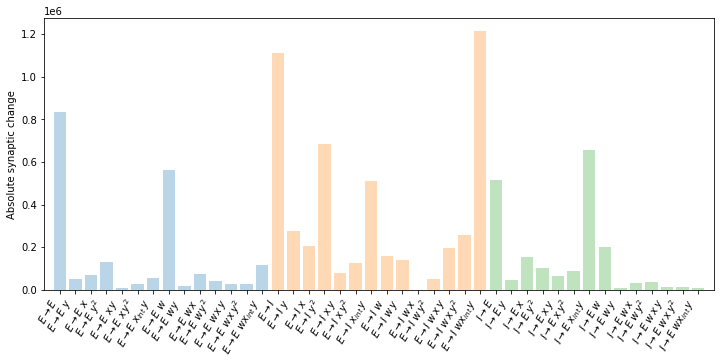

...

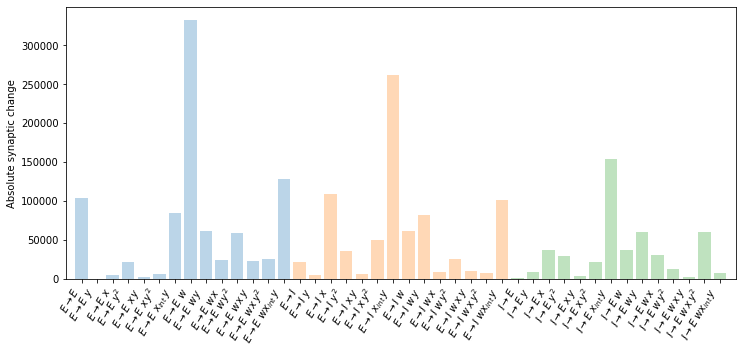

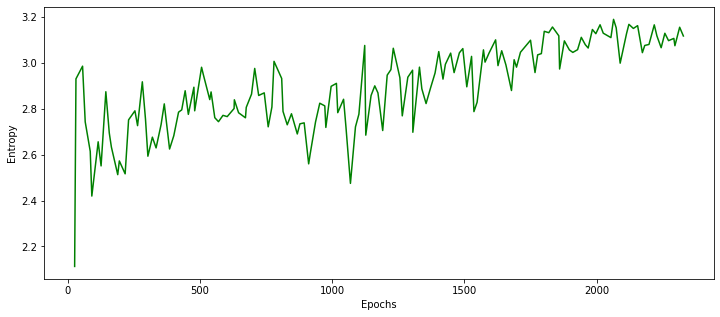

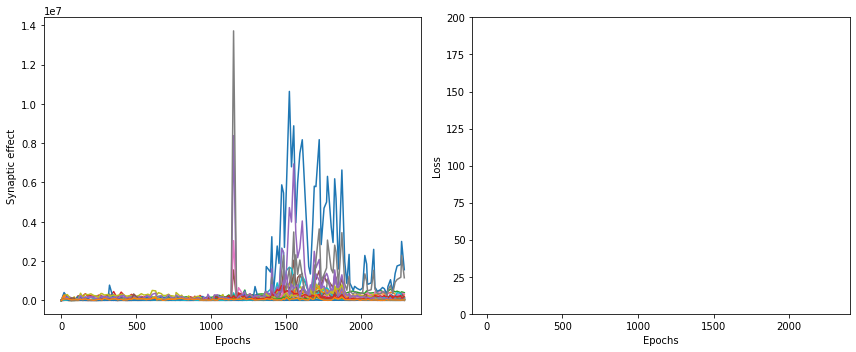

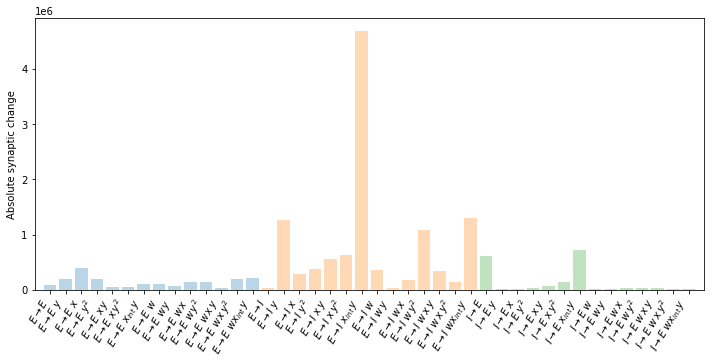

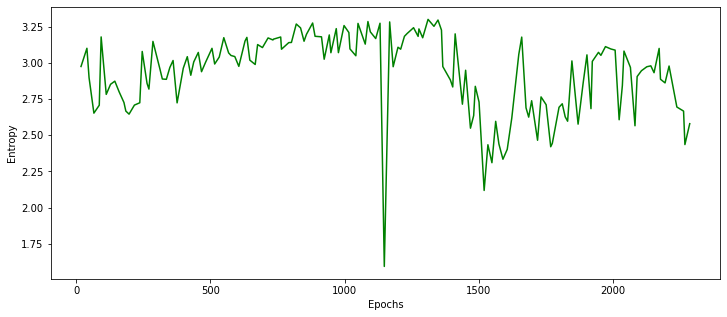

In [ ]:
all_files = [
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:03.835156',
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:03.864367',
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:04.704892',
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:04.704988',
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:04.704990',
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:17.223324',
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:17.228308',
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:35.703655',
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:35.703656',
    'seq_syn_effects_tracked_2_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-03_14:09:35.703661',
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:44.627834',
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:44.629392',
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:44.629779',
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:58.197033', 
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:58.197035',
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:58.197432',
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:58.197776',
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:58.197778',
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:58:58.197855',
    'seq_syn_effects_tracked_3_batch_20_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2023-01-06_14:59:07.797345',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 42, 20, yscale=2e6, n_categories=3)
    if best_loss_for_f < 60:
        print(f'{f}')
        final_syn_effects.append(syn_effects_for_f)
        final_plasticity_coefs.append(plasticity_coefs_for_f)
    
final_syn_effect_means = np.mean(np.stack(final_syn_effects), axis=0)
final_syn_effect_stds = np.std(np.stack(final_syn_effects), axis=0) / np.sqrt(9)

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 3
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names, rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names, rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names, rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig2, axs2 = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs2.bar(x, y, alpha=0.3)
    
axs2.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs2.set_xticklabels(rule_names, rotation=60, ha='right')
axs2.set_ylabel('Coefficient')
axs2.set_xlim(-1, len(final_plasticity_coef_means))


(-1.0, 42.0)

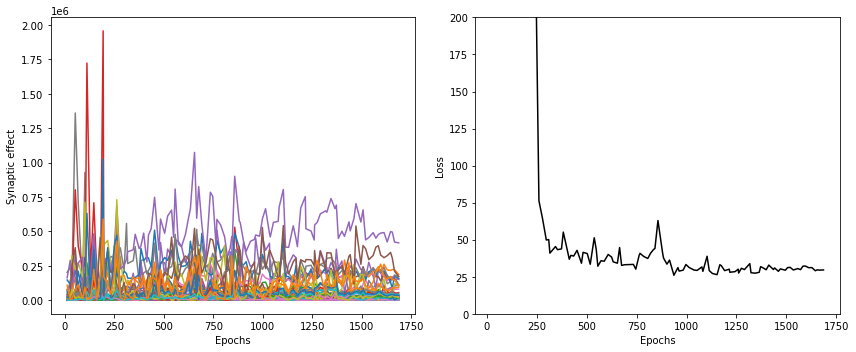

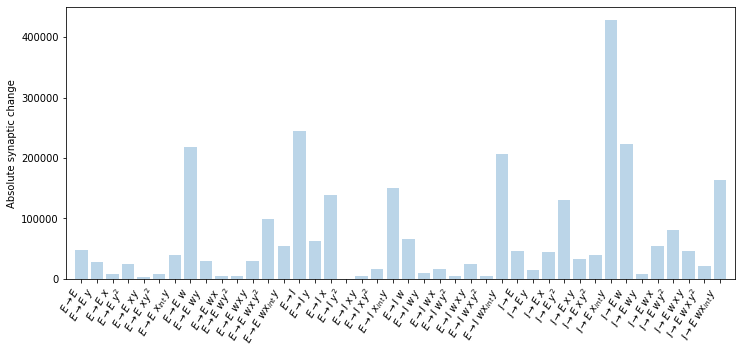

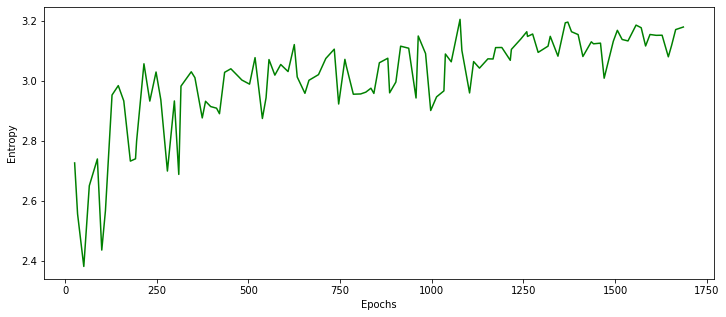

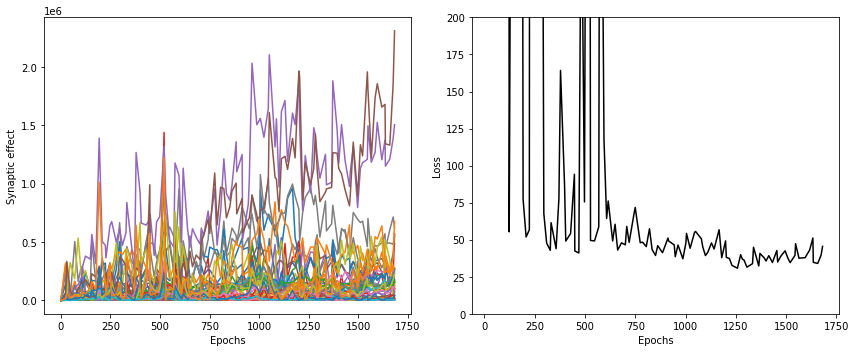

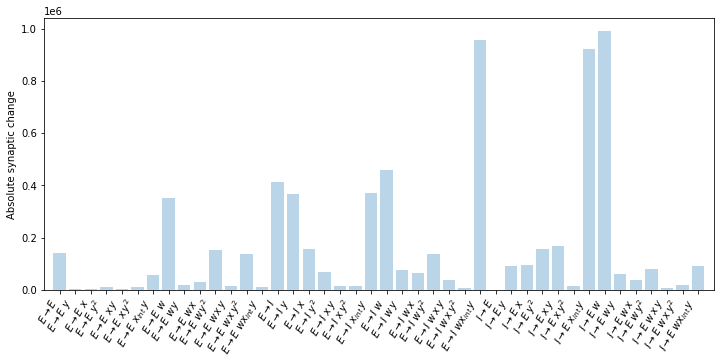

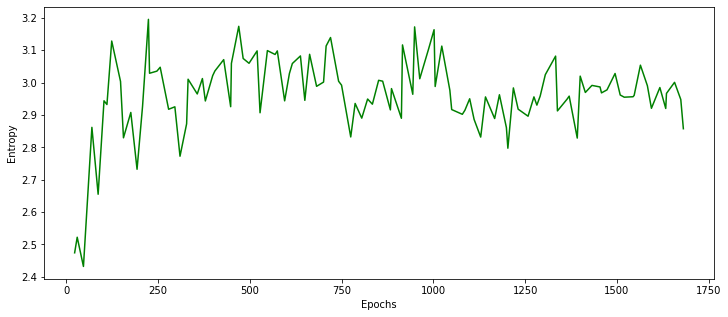

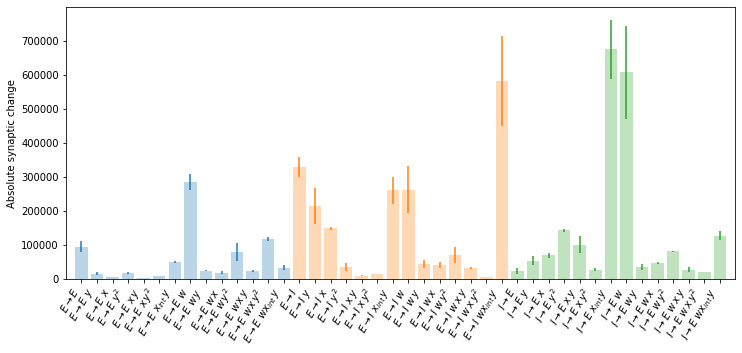

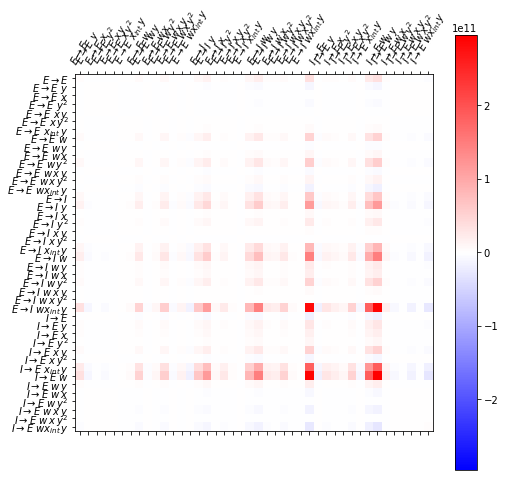

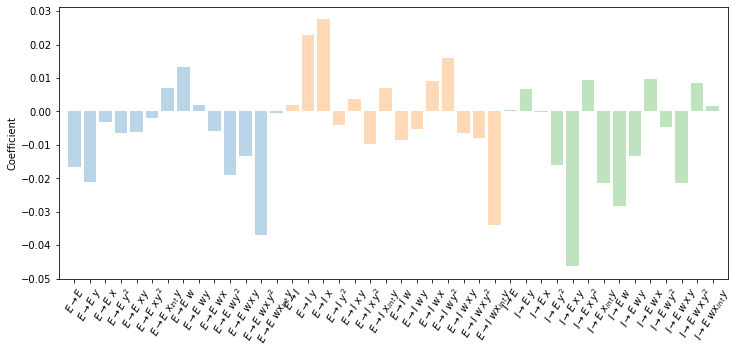

In [6]:
all_files = [
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_1e-07_1e-07_1e-07_2022-12-30_16:03:22.193554',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_1e-07_1e-07_1e-07_2022-12-30_16:03:27.345438',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 42, 30, yscale=2e6)
    final_syn_effects.append(syn_effects_for_f)
    final_plasticity_coefs.append(plasticity_coefs_for_f)
    
final_syn_effect_means = np.mean(np.stack(final_syn_effects), axis=0)
final_syn_effect_stds = np.std(np.stack(final_syn_effects), axis=0) / np.sqrt(8)

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 3
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names, rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names, rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names, rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    
axs.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs.set_xticklabels(rule_names, rotation=60)
axs.set_ylabel('Coefficient')
axs.set_xlim(-1, len(final_plasticity_coef_means))

# print(set_smallest_n_zero(final_syn_effect_means, 10, ))

(-1.0, 42.0)

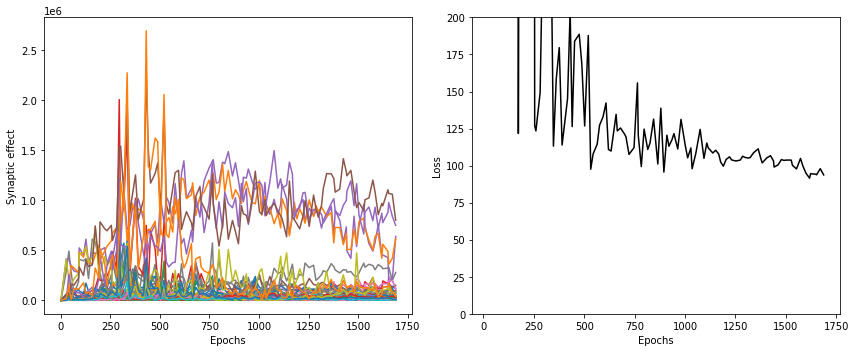

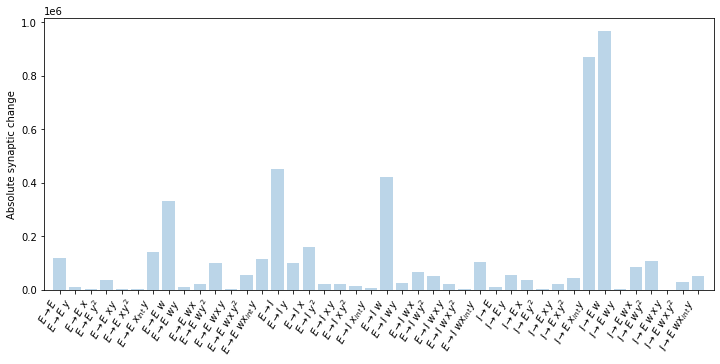

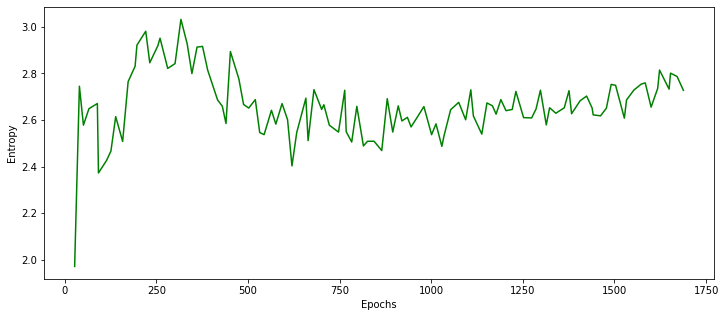

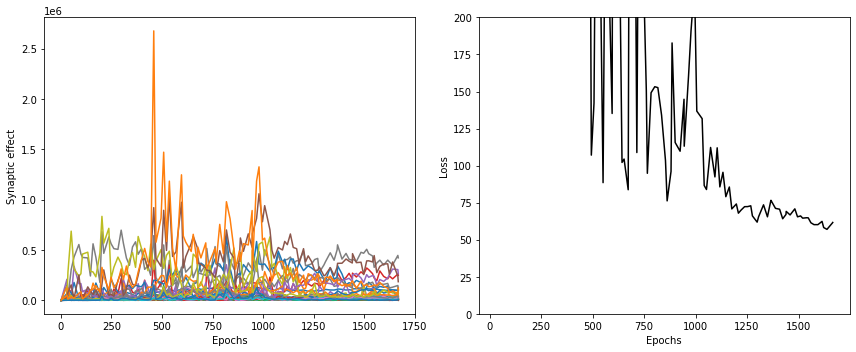

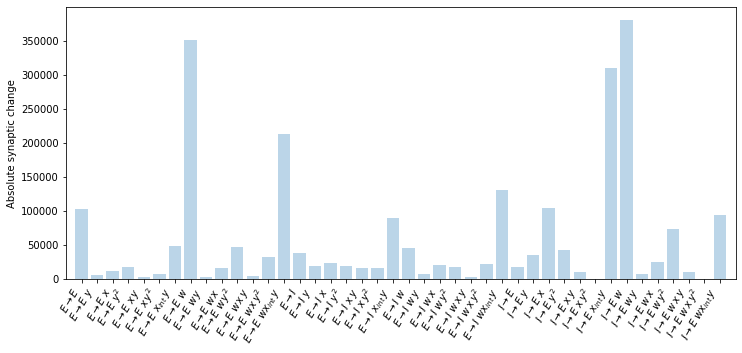

...

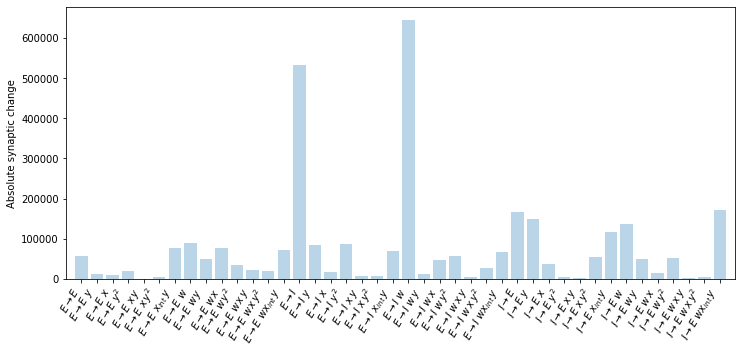

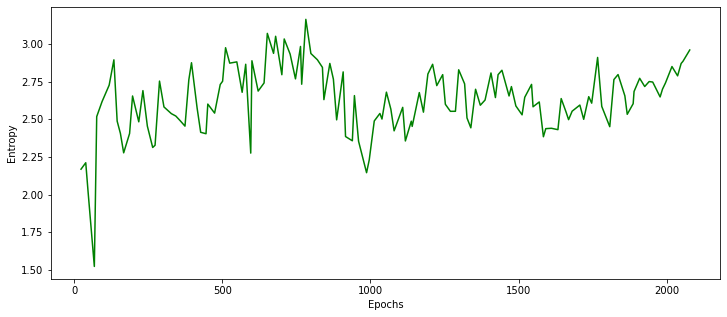

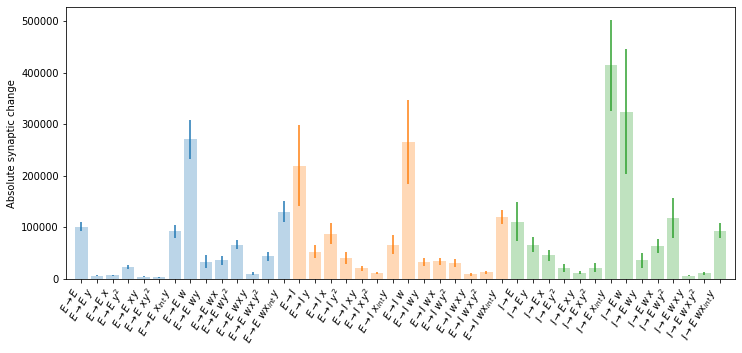

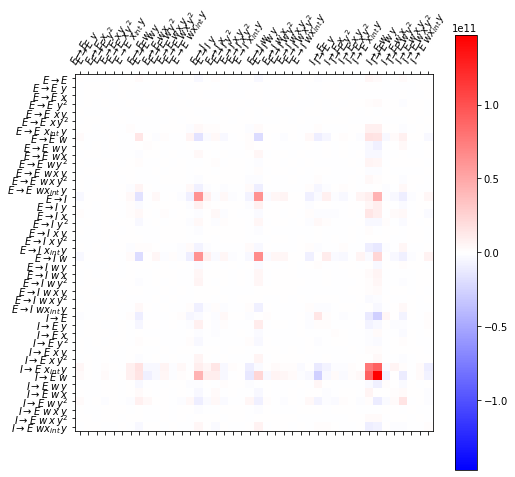

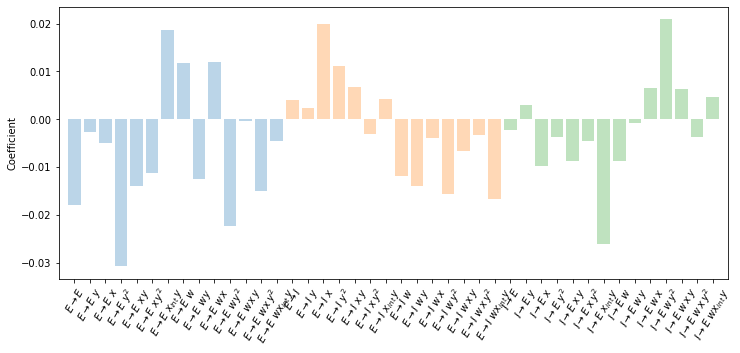

In [7]:
all_files = [
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-30_16:03:22.193689',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-30_16:03:42.323179', 
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-30_16:04:12.474681',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-30_16:04:29.248905', 
#     'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-30_16:08:42.485978', 
#     'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-31_00:08:52.873059', 
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-31_00:09:05.635617', 
#     'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-31_00:41:37.955079',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 42, 30, yscale=2e6)
    final_syn_effects.append(syn_effects_for_f)
    final_plasticity_coefs.append(plasticity_coefs_for_f)
    
final_syn_effect_means = np.mean(np.stack(final_syn_effects), axis=0)
final_syn_effect_stds = np.std(np.stack(final_syn_effects), axis=0) / np.sqrt(8)

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 3
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names, rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names, rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names, rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    
axs.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs.set_xticklabels(rule_names, rotation=60)
axs.set_ylabel('Coefficient')
axs.set_xlim(-1, len(final_plasticity_coef_means))

# print(set_smallest_n_zero(final_syn_effect_means, 10, ))

[-2.33995094e-04 -2.77033353e-02 -1.90610918e-03 -3.77320599e-02
  1.41528513e-02 -1.47862599e-03  2.43366170e-04  1.72672313e-03
 -8.30256785e-05  3.39229640e-02 -1.60501454e-02  3.40249709e-04
 -1.07423732e-01  6.99329604e-03]


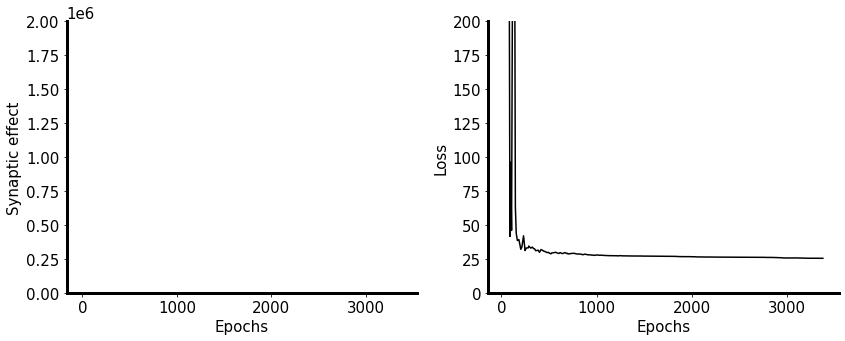

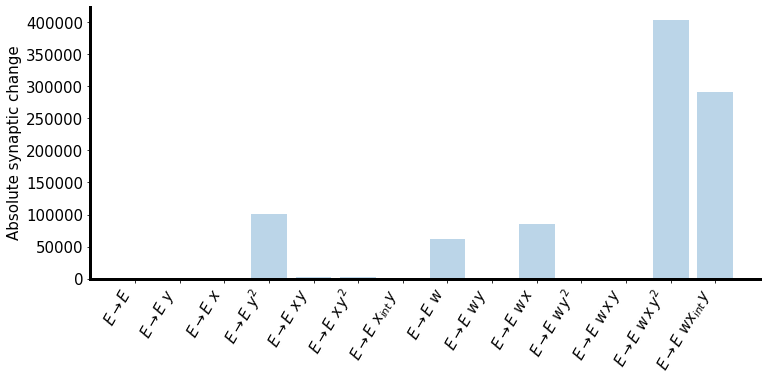

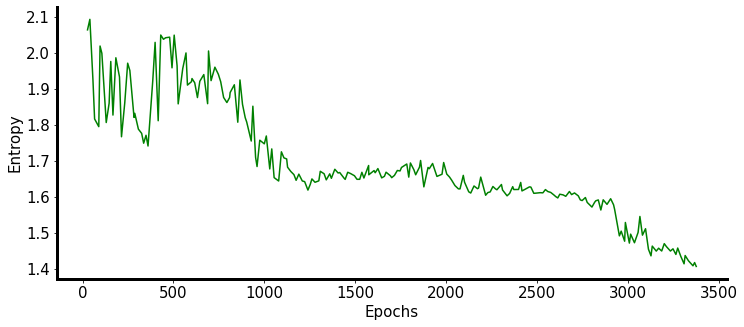

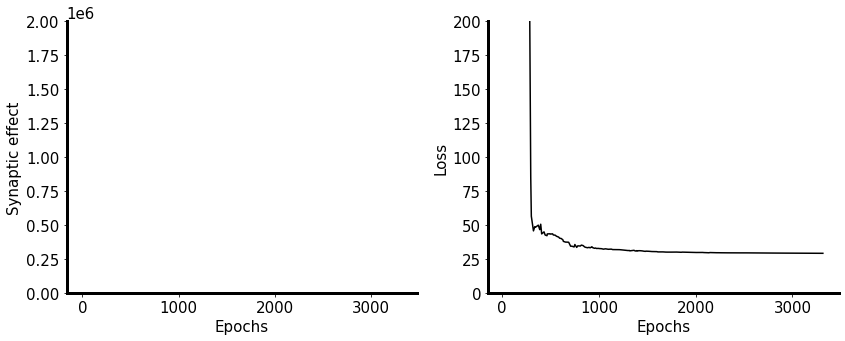

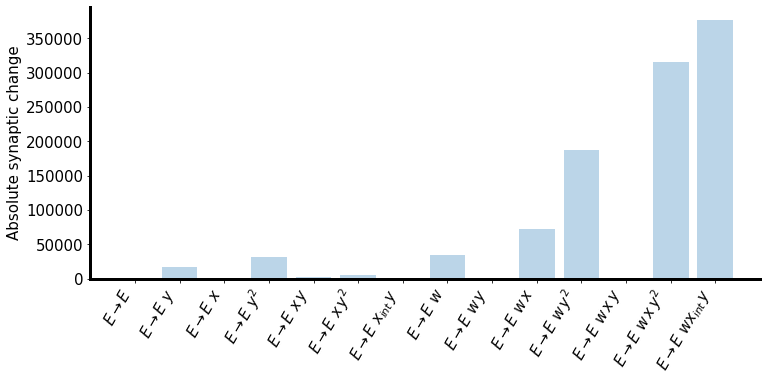

...

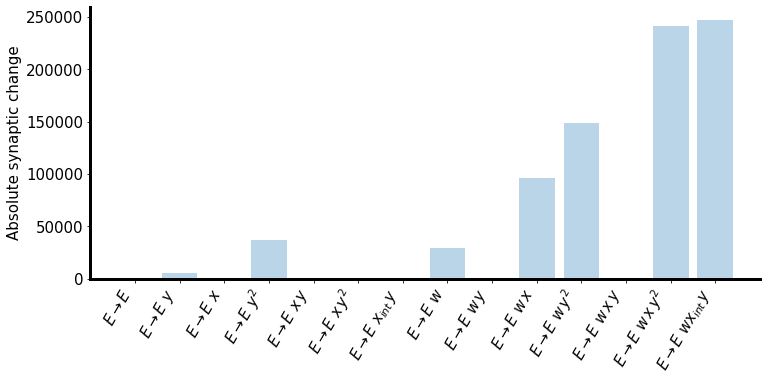

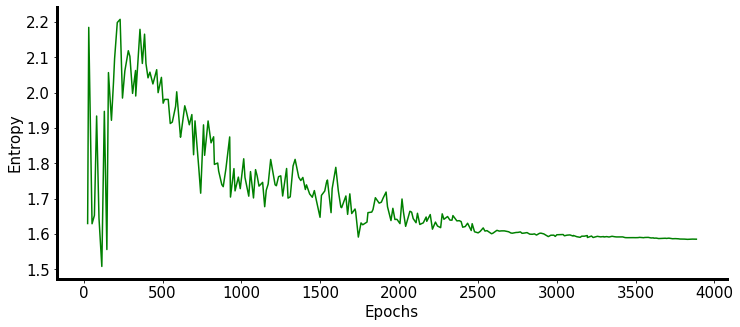

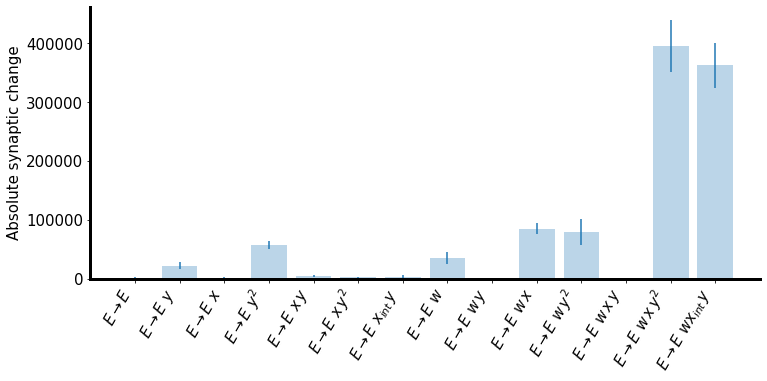

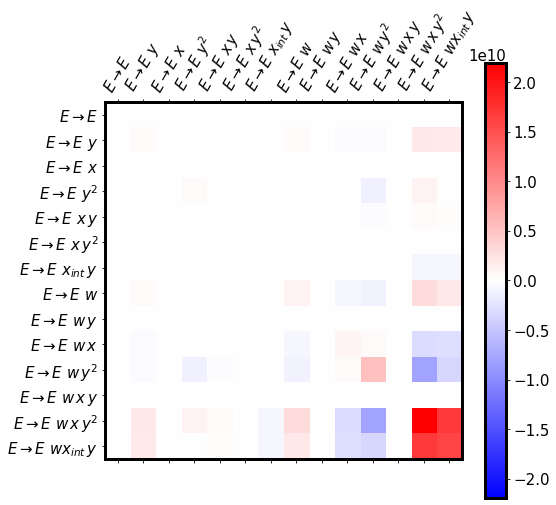

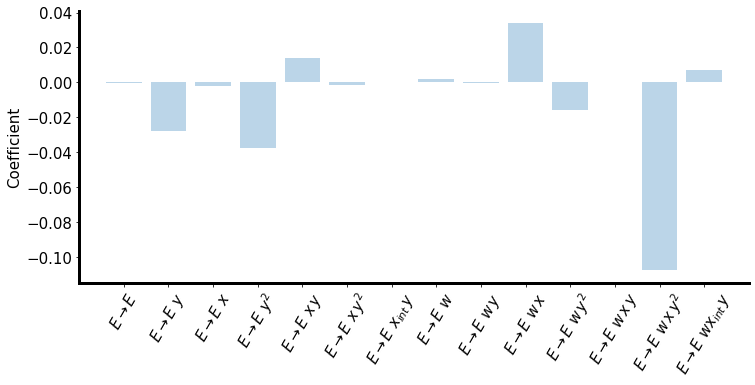

In [7]:
all_files = [
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:51:52.518743',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:51:52.519243',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:51:53.344936',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:52:01.994459',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:52:01.994460',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:52:01.994481',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:52:56.741378',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:52:56.741397',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:52:57.660707',
    'seq_syn_effects_tracked_batch_30_STD_EXPL_0.005_FIXED_True_L1_PENALTY_5e-07_5e-07_5e-07_2022-12-28_11:54:15.319681',
]

final_syn_effects = []
final_plasticity_coefs = []

for f in all_files:
    syn_effects_for_f, plasticity_coefs_for_f, best_loss_for_f = plot_all_2(f, 14, 30, n_categories=1, yscale=2e6)
    final_syn_effects.append(syn_effects_for_f)
    final_plasticity_coefs.append(plasticity_coefs_for_f)
    
final_syn_effect_means = np.mean(np.stack(final_syn_effects), axis=0)
final_syn_effect_stds = np.std(np.stack(final_syn_effects), axis=0) / np.sqrt(10)

final_plasticity_coef_means = np.mean(np.stack(final_plasticity_coefs), axis=0)

# plot the synaptic effects of each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)
partial_rules_len = int(len(final_syn_effect_means) / n_categories)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_syn_effect_means[l * partial_rules_len: (l+1) * partial_rules_len]
    y_err = final_syn_effect_stds[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    axs.errorbar(x, y, yerr=y_err, ls='none')
    
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names, rotation=60, ha='right')
axs.set_ylabel('Absolute synaptic change')
axs.set_xlim(-1, len(final_syn_effect_means))

# plot covariance of synaptic changes due to each rule
normed_syn_effect_means = final_syn_effect_means / np.sum(final_syn_effect_means)

fig, axs = plt.subplots(1, 1, figsize=(4 * scale, 4 * scale))
syn_effect_cov_mat = np.cov(np.array(final_syn_effects).T)
max_abs_val = np.max(np.abs(syn_effect_cov_mat))
mappable = axs.matshow(syn_effect_cov_mat, cmap='bwr', vmin=-max_abs_val, vmax=max_abs_val)
plt.colorbar(mappable)
axs.set_xticks(np.arange(len(final_syn_effect_means)))
axs.set_xticklabels(rule_names, rotation=60)
axs.set_yticks(np.arange(len(final_syn_effect_means)))
axs.set_yticklabels(rule_names, rotation=0)

# plot the coefficients assigned to each plasticity rule (unsorted by size)
scale = 2
n_categories = 1
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 2.5 * scale))
format_axs(axs)

for l in range(n_categories):
    x = np.arange(partial_rules_len) + l * partial_rules_len
    y = final_plasticity_coef_means[l * partial_rules_len: (l+1) * partial_rules_len]
    axs.bar(x, y, alpha=0.3)
    
axs.set_xticks(np.arange(len(final_plasticity_coef_means)))
axs.set_xticklabels(rule_names, rotation=60)
axs.set_ylabel('Coefficient')
axs.set_xlim(-1, len(final_plasticity_coef_means))

print(final_plasticity_coef_means)


$$ \mathcal{L} = \sum_i \sigma(<t_i> - <t_{i+1}>) + \sum_i \mathrm{Var}(<t_i>) + \left(\mathrm{Duration}(r_i) - V_0\right)^2 + \left(\int r_i - R_0 \right)^2 $$